<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_unstable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

1.   How do income and spending patterns vary across different regions in the Philippines?
2.   Can we identify clusters of regions with similar economic characteristics?
3. What are the distinguishing characteristics of each cluster in terms of spending habits?


In [123]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split

# Data Loading

In [124]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [126]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [127]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [128]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [129]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [130]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [131]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [132]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [133]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [134]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [135]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


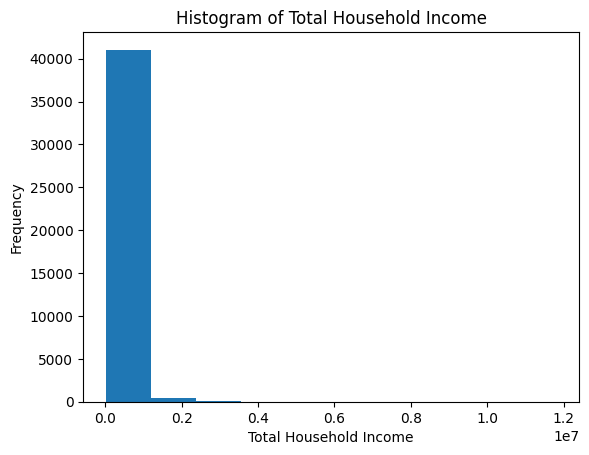

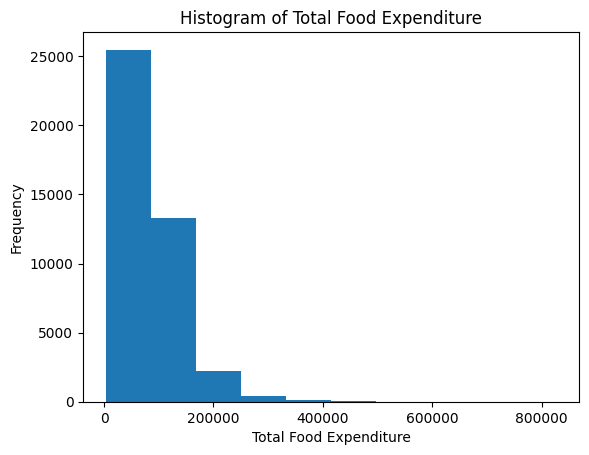

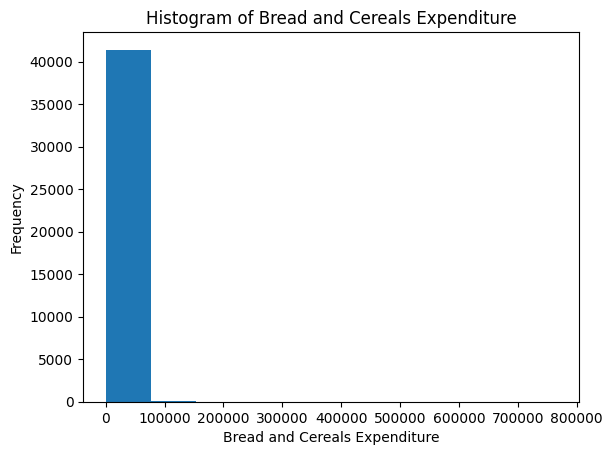

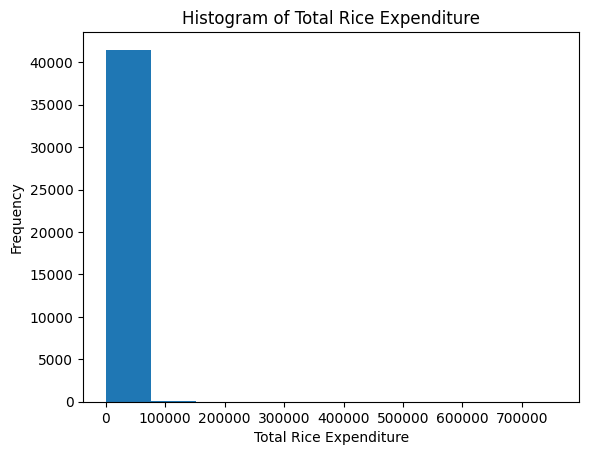

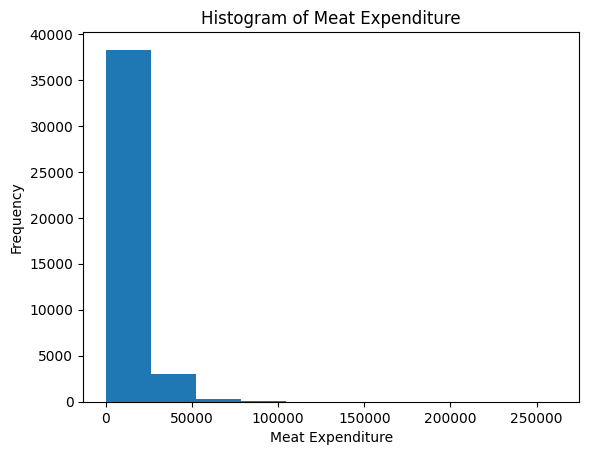

...

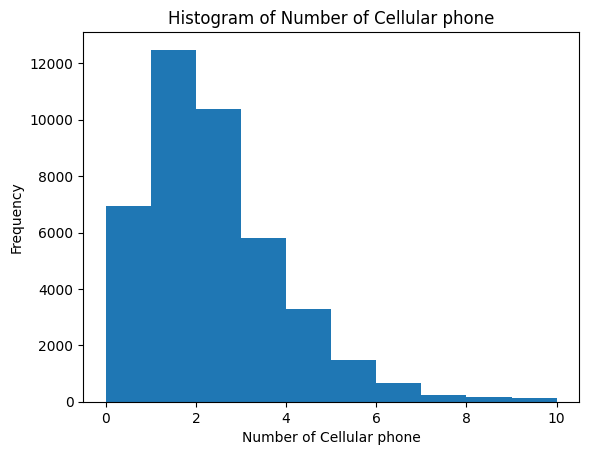

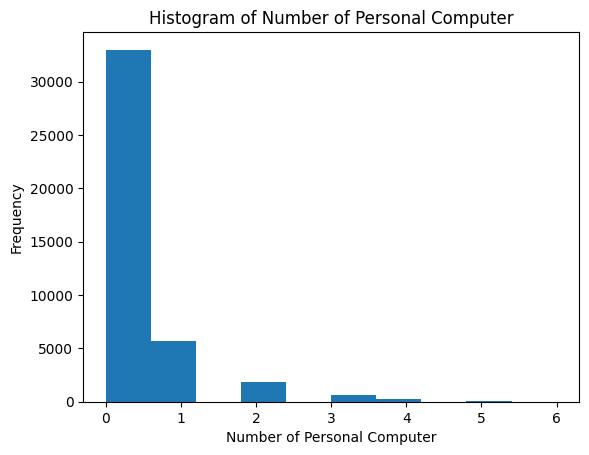

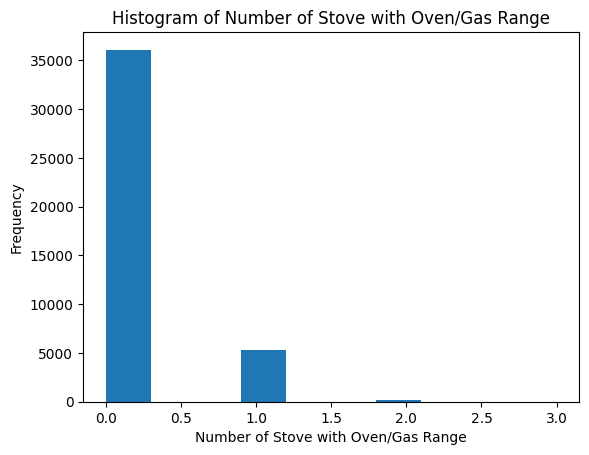

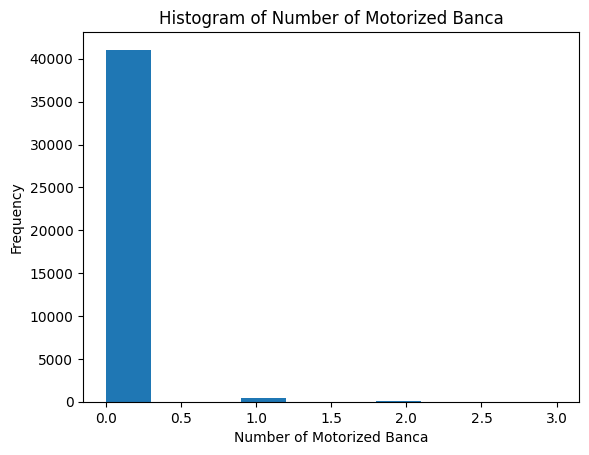

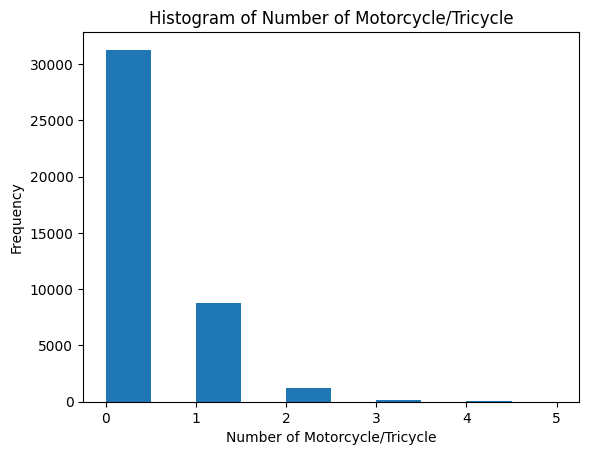

In [136]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [137]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


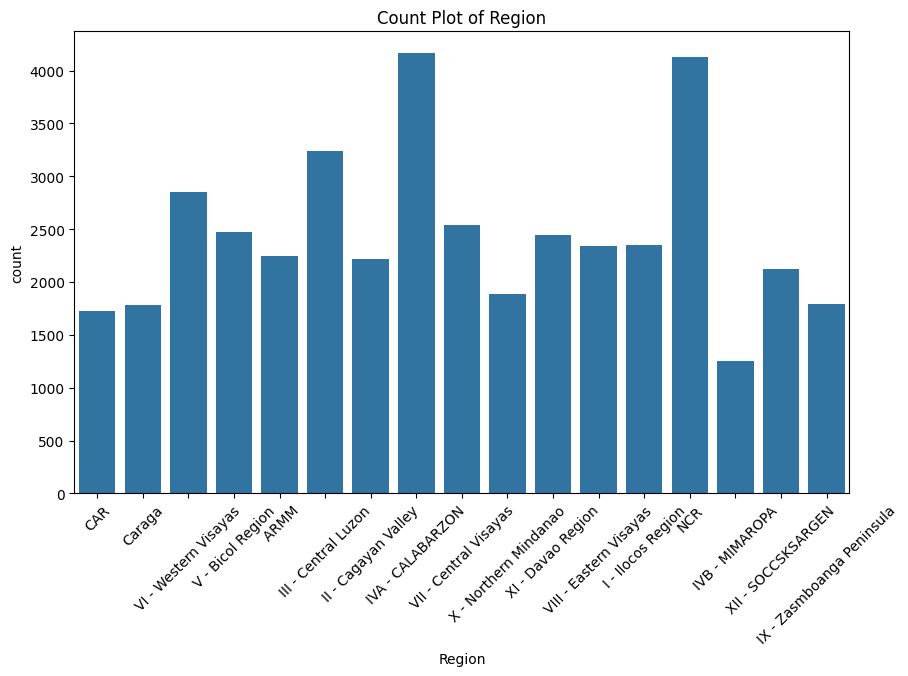

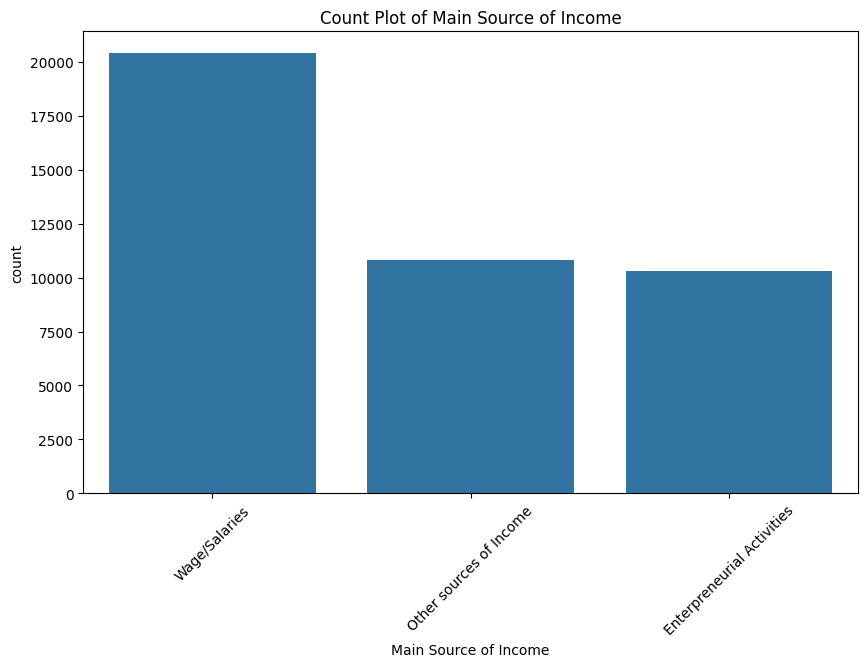

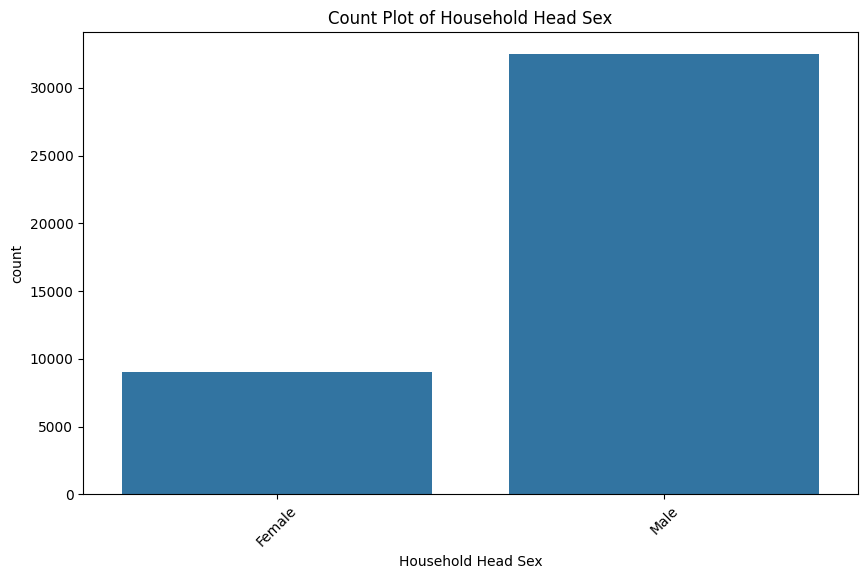

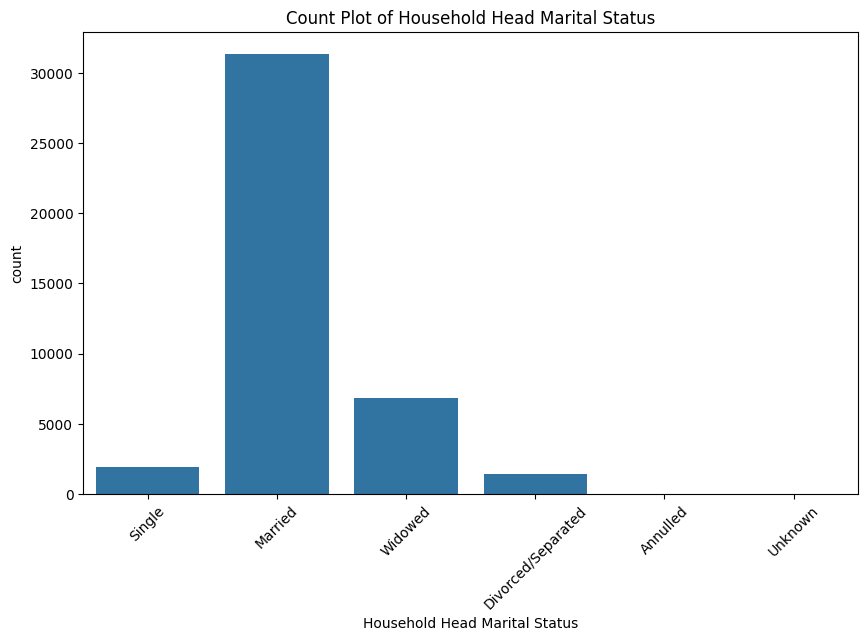

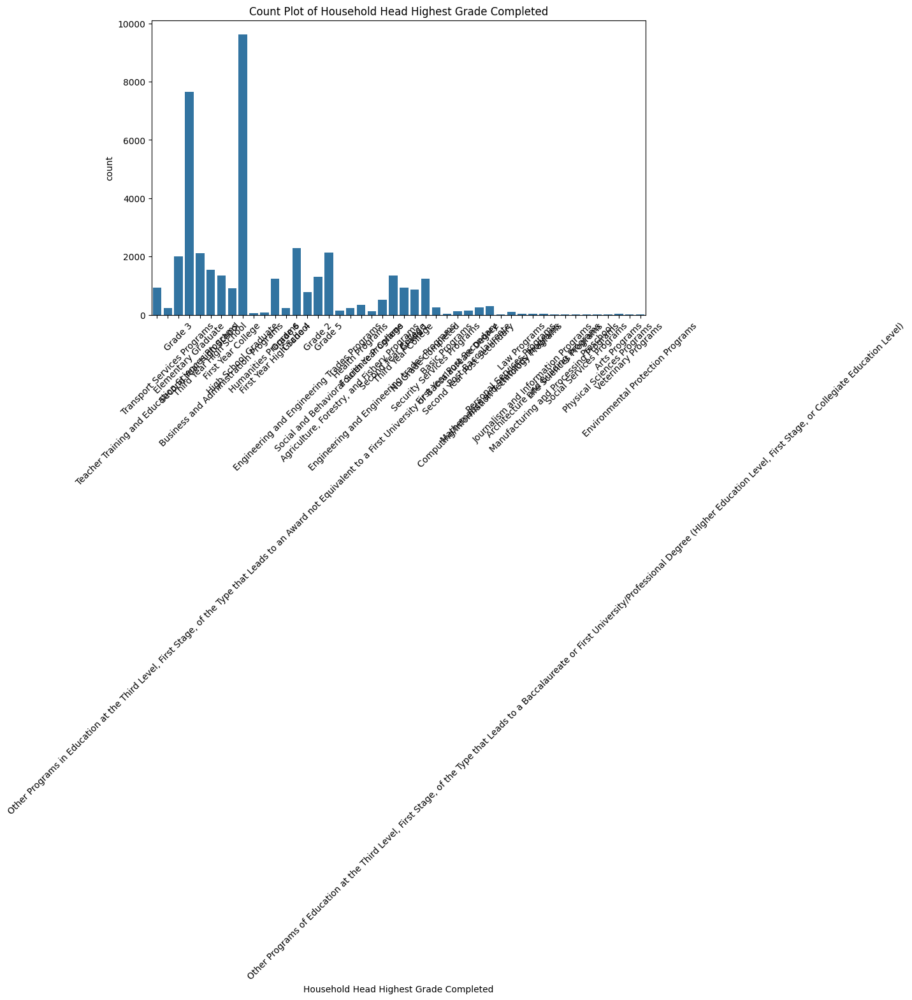

...

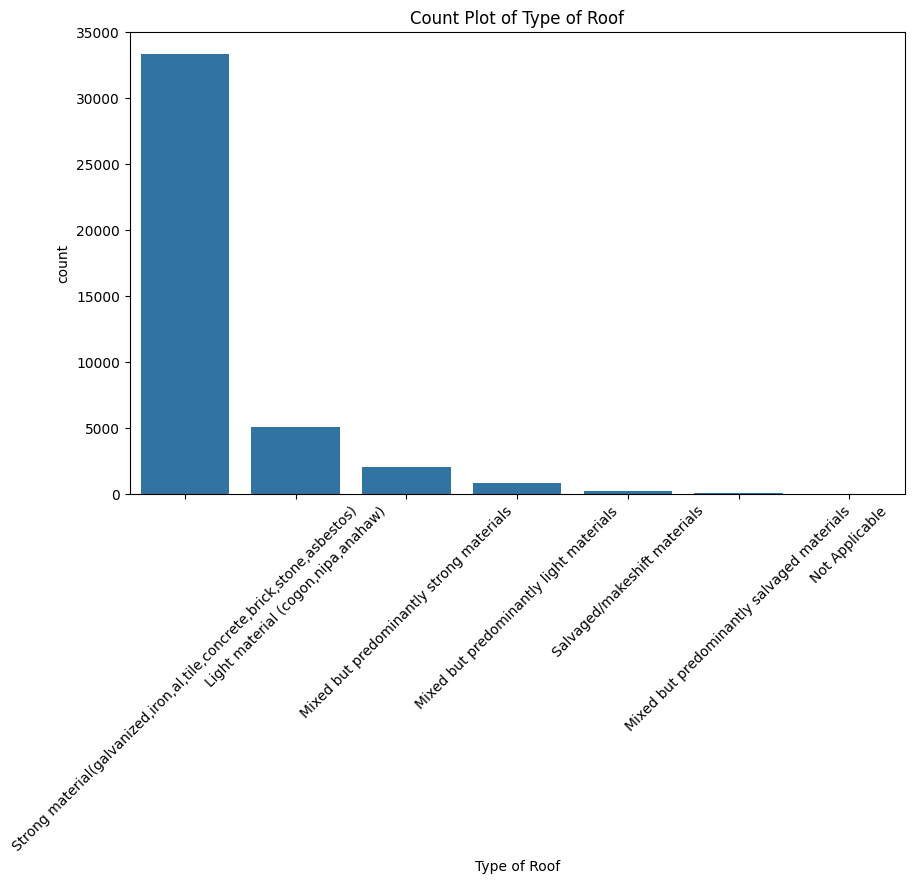

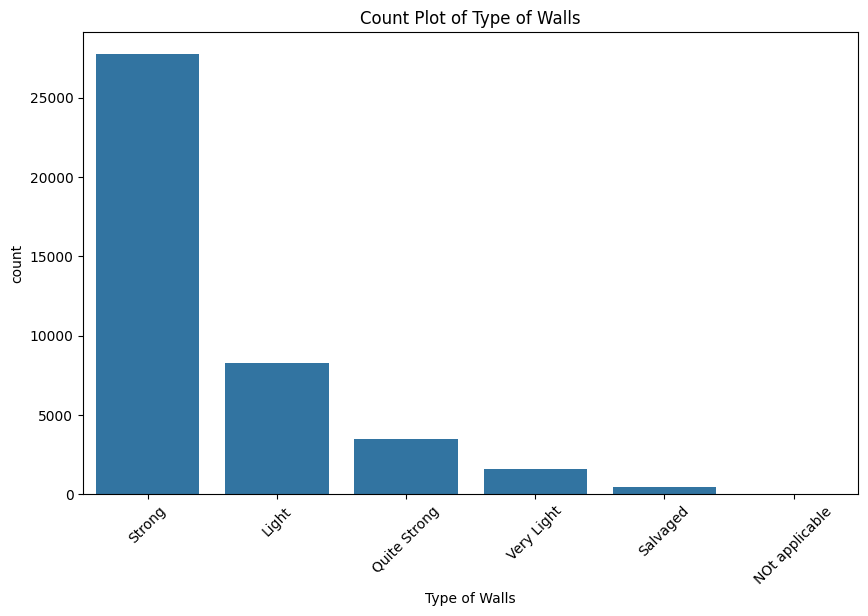

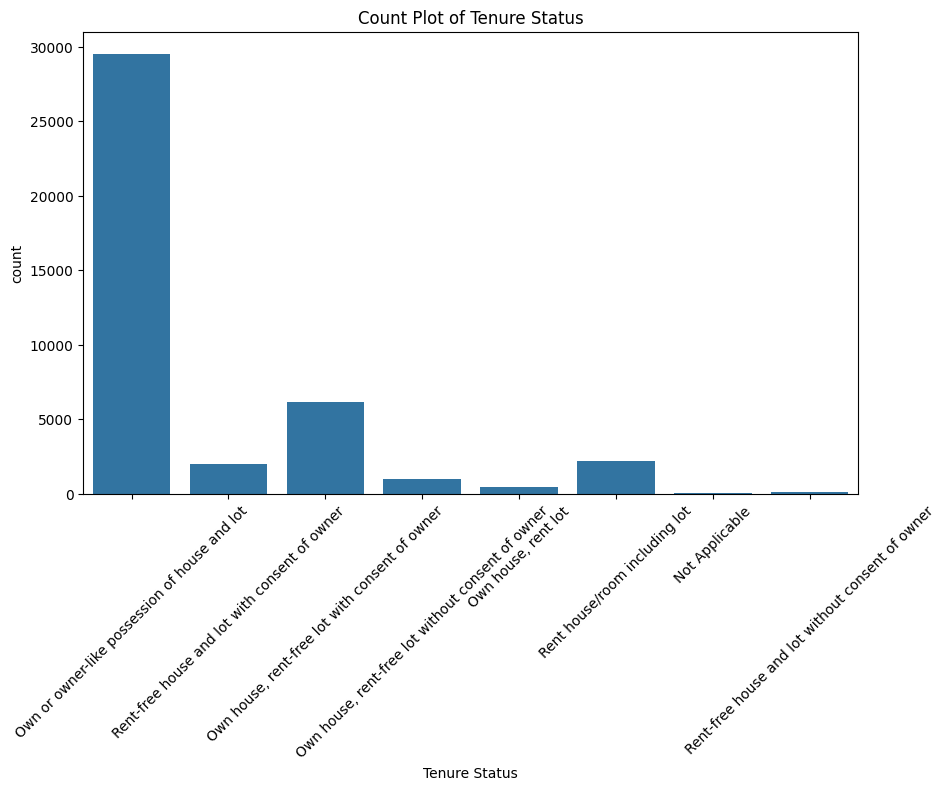

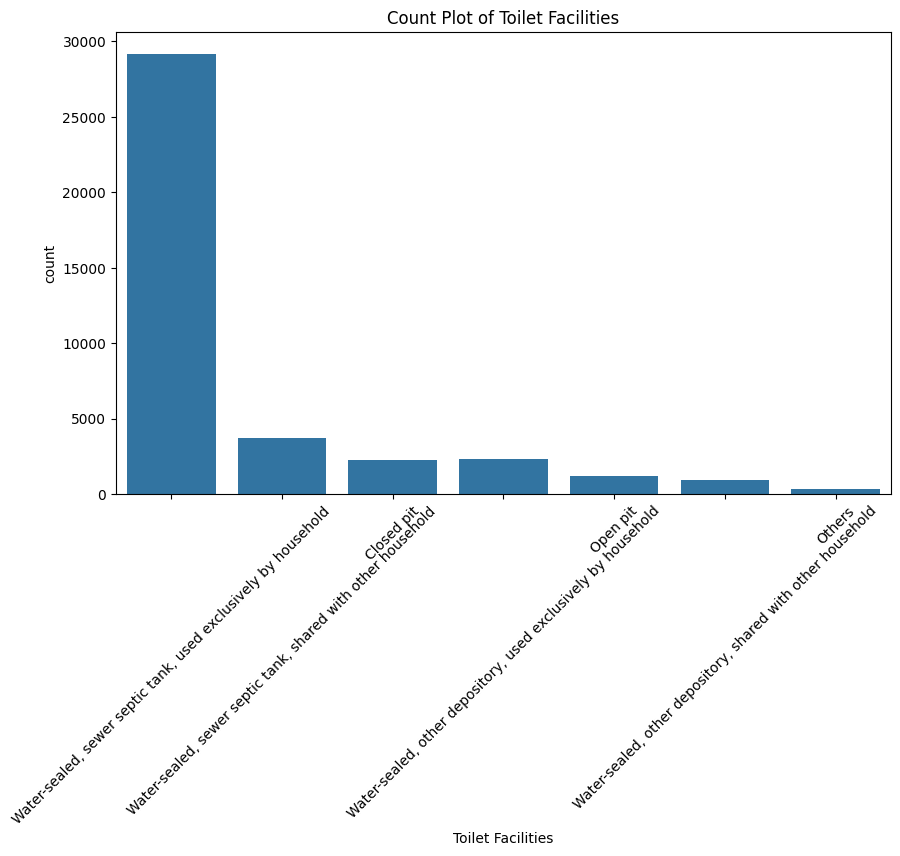

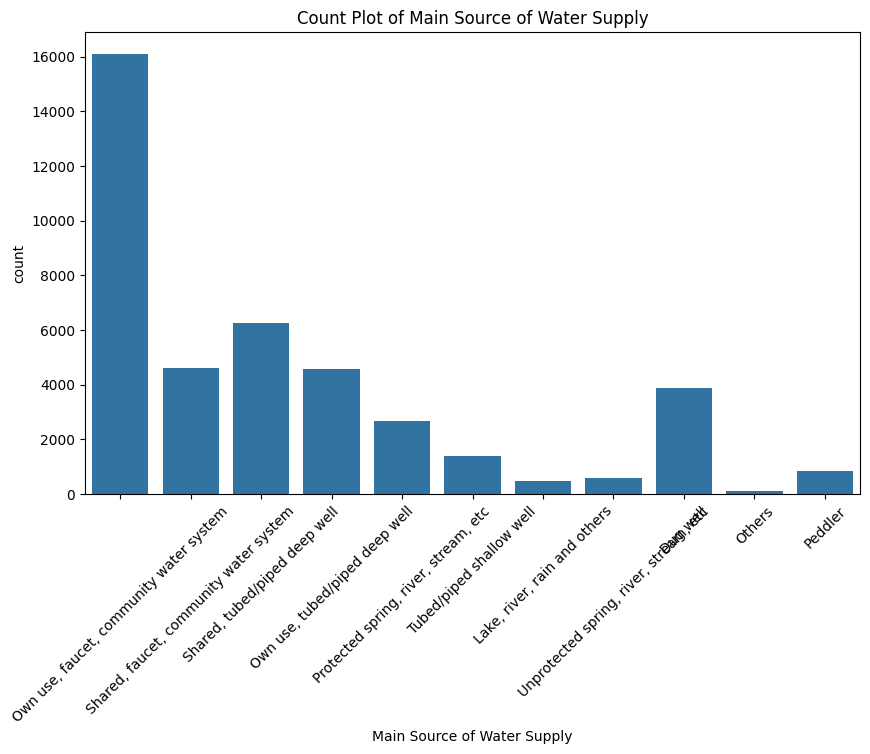

In [138]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [139]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [140]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [141]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [142]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [143]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [144]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [145]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [146]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [147]:
df[df['Toilet Facilities'].isna()]['Region'].value_counts() # 1580 Null Values

,count
Region,
V - Bicol Region,277
VI - Western Visayas,224
VIII - Eastern Visayas,210
VII - Central Visayas,193
ARMM,144
IVA - CALABARZON,112
XII - SOCCSKSARGEN,86
IVB - MIMAROPA,76
Caraga,74


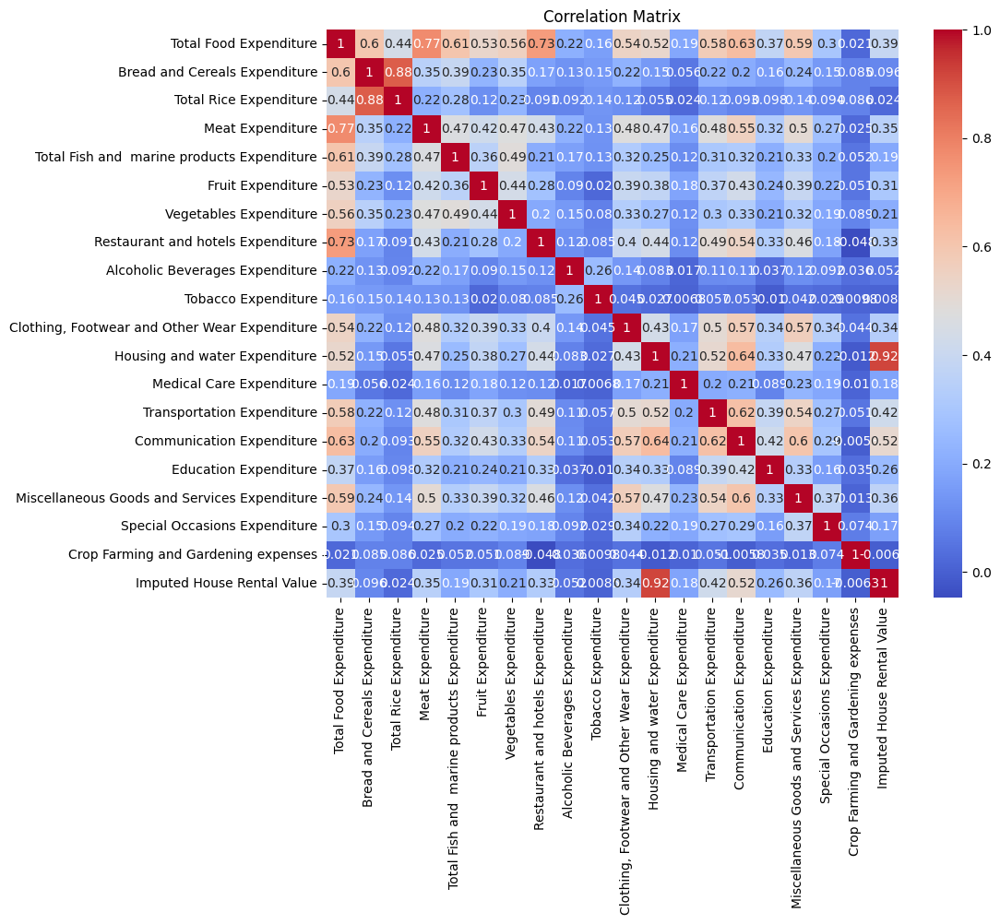

In [148]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [149]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [150]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [151]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure', 'Education Expenditure',
                  'Communication Expenditure', 'Transportation Expenditure']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [152]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Crop Farming and Gardening expenses'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [153]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

Text(0.5, 0, 'Total_Essential_Spending')

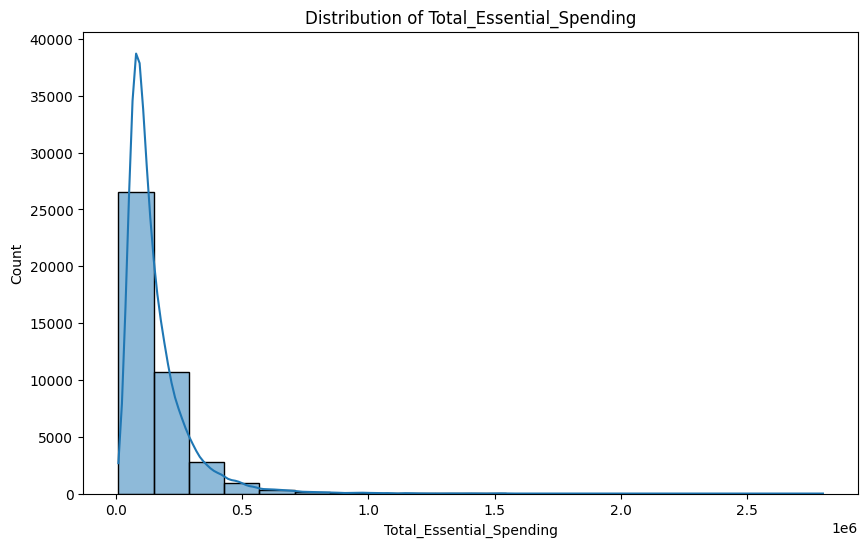

In [154]:
# Plot Total_Essential Spending
plt.figure(figsize=(10, 6))
sns.histplot(df['Total_Essential_Spending'], bins=20, kde=True)
plt.title('Distribution of Total_Essential_Spending')
plt.xlabel('Total_Essential_Spending')

Text(0.5, 0, 'Total_NonEssential_Spending')

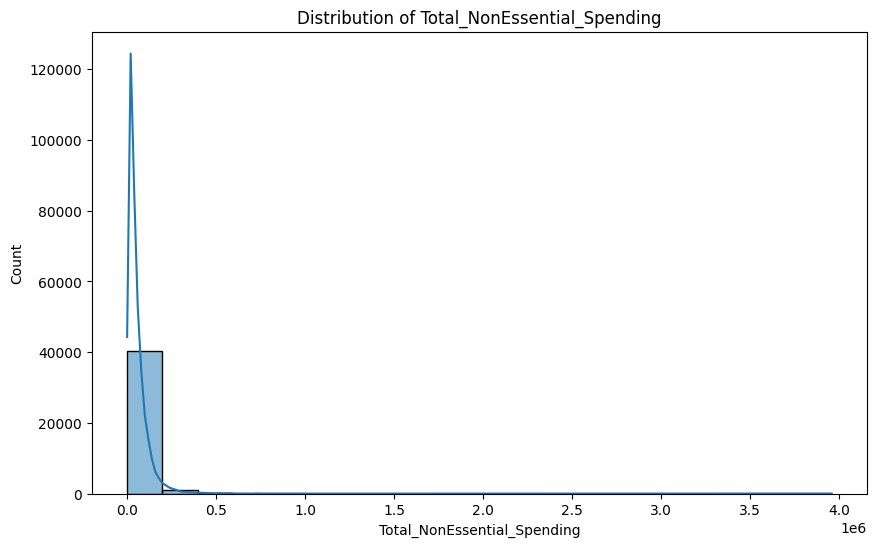

In [155]:
# Plot Non-Essential Spending
plt.figure(figsize=(10, 6))
sns.histplot(df['Total_NonEssential_Spending'], bins=20, kde=True)
plt.title('Distribution of Total_NonEssential_Spending')
plt.xlabel('Total_NonEssential_Spending')

Text(0.5, 0, 'Total Expenditure')

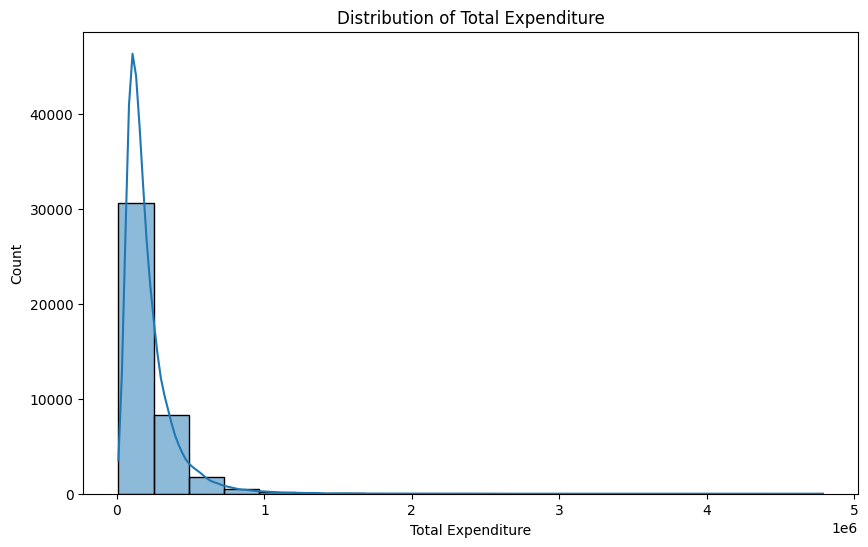

In [156]:
# Plot Total Expenditure
plt.figure(figsize=(10, 6))
sns.histplot(df['Total Expenditure'], bins=20, kde=True)
plt.title('Distribution of Total Expenditure')
plt.xlabel('Total Expenditure')

Text(0.5, 0, 'Total Household Income')

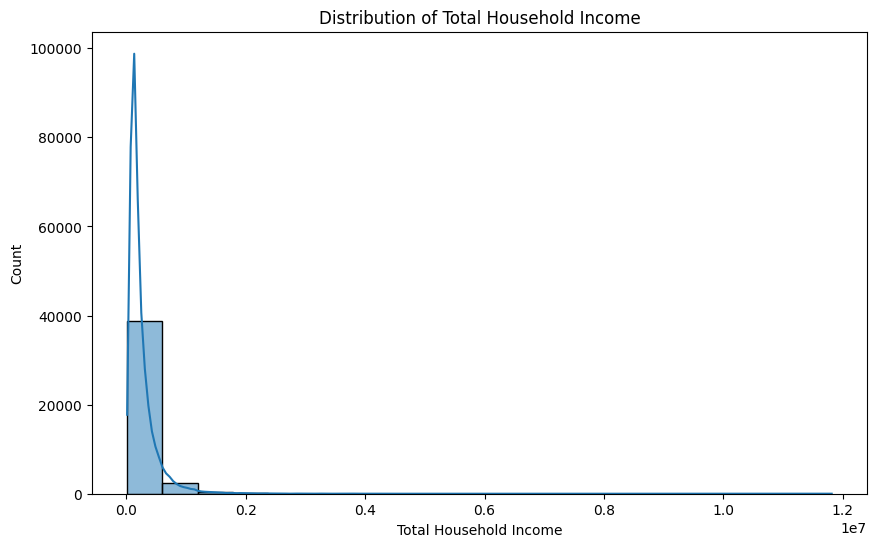

In [157]:
# Plot Total Household Income
plt.figure(figsize=(10, 6))
sns.histplot(df['Total Household Income'], bins=20, kde=True)
plt.title('Distribution of Total Household Income')
plt.xlabel('Total Household Income')

In [158]:
# Add Newly Created Expenditure Columns to Expenditure cols
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 64 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [160]:
# Categorize Household, Electronic Appliances, and Vehicle Counts
household_appliances = ['Number of Refrigerator/Freezer',
                        'Number of Airconditioner',
                'Number of Stove with Oven/Gas Range',
                'Number of Washing Machine']

electronic_appliances = ['Number of Television', 'Number of CD/VCD/DVD',
                 'Number of Landline/wireless telephones', 'Number of Cellular phone',
                 'Number of Personal Computer', 'Number of Component/Stereo set']

vehicles_counts = ['Number of Car, Jeep, Van', 'Number of Motorcycle/Tricycle', 'Number of Motorized Banca']

In [161]:
# Create Household and Electronic Appliances and Vehicle Counts
df['Household_Appliances'] = df[household_appliances].sum(axis=1)
df['Electronic_Appliances'] = df[electronic_appliances].sum(axis=1)
df['Vehicles_Count'] = df[vehicles_counts].sum(axis=1)

In [162]:
# Drop all columns in household_appliances, electronic_appliances, and vehicles_counts from Numerical columns
for col in household_appliances:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

for col in electronic_appliances:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

for col in vehicles_counts:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

Text(0, 0.5, 'Frequency')

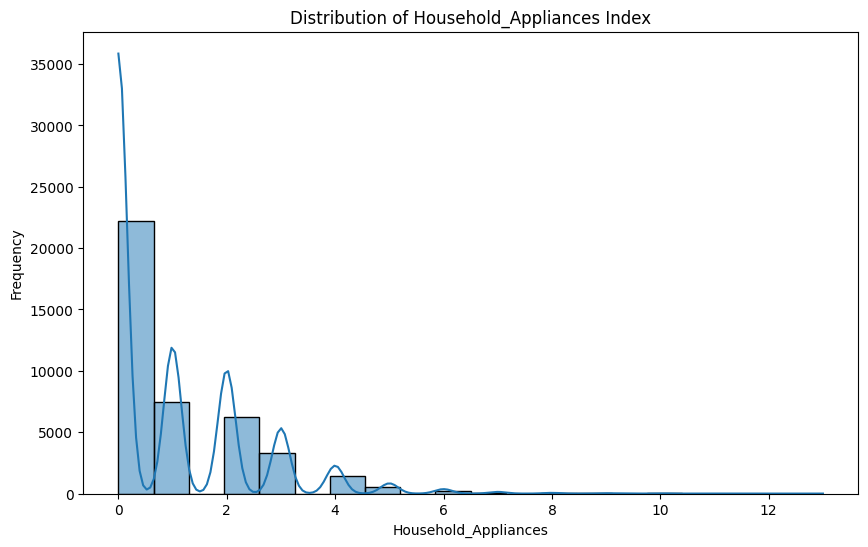

In [163]:
# Plot Household Appliances Index
plt.figure(figsize=(10, 6))
sns.histplot(df['Household_Appliances'], bins=20, kde=True)
plt.title('Distribution of Household_Appliances Index')
plt.xlabel('Household_Appliances')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

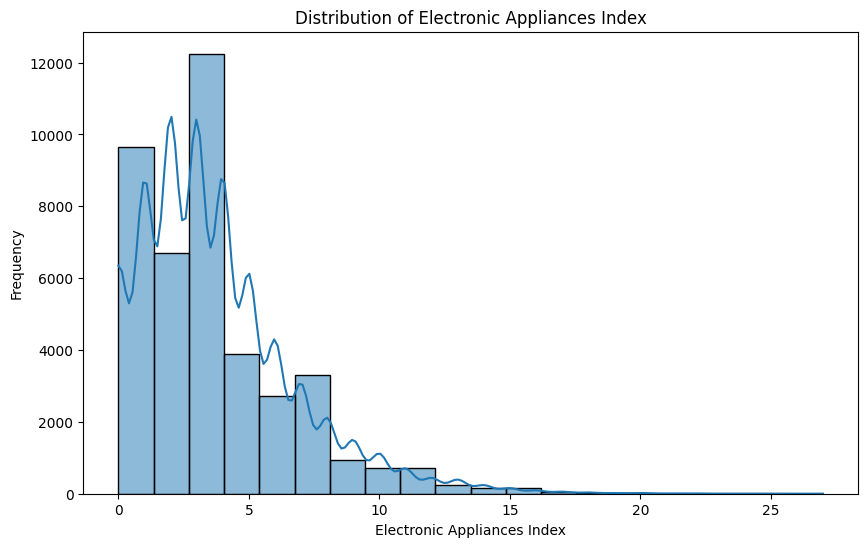

In [164]:
# Plot Electronic Appliances Assets
plt.figure(figsize=(10, 6))
sns.histplot(df['Electronic_Appliances'], bins=20, kde=True)
plt.title('Distribution of Electronic Appliances Index')
plt.xlabel('Electronic Appliances Index')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

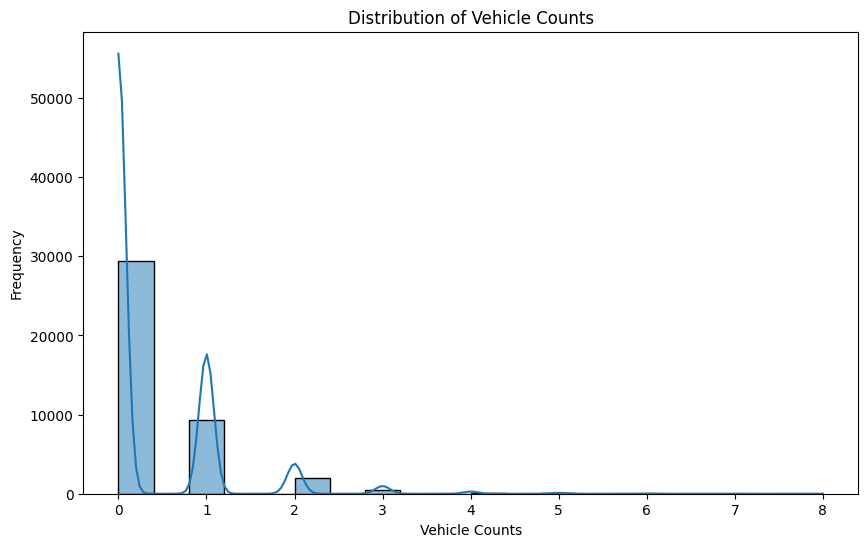

In [165]:
# Plot Vehicle Counts
plt.figure(figsize=(10, 6))
sns.histplot(df['Vehicles_Count'], bins=20, kde=True)
plt.title('Distribution of Vehicle Counts')
plt.xlabel('Vehicle Counts')
plt.ylabel('Frequency')

In [166]:
# Duplicate dataset
df_copy = df.copy()

In [167]:
# Create Modified expenditure columns
'''modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']'''

modified_expenditure_columns = ['Total Food Expenditure', 'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']
'''modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses', 'Total Expenditure']'''

"modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',\n                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',\n                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',\n                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',\n                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses', 'Total Expenditure']"

In [168]:
# Remove columns in the dataframe that does not exists in both modified_expenditure_columns and expenditure_columns
for col in expenditure_columns:
    if col not in modified_expenditure_columns:
        df_copy.drop(col, axis=1, inplace=True)

In [169]:
# Remove columns in the dataframe from household appliances
for col in household_appliances:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)

In [170]:
# Remove columns in the dataframe from luxury assets
for col in electronic_appliances:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)

In [171]:
# Remove columns in the dataframe from vehicles_counts
for col in vehicles_counts:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)

In [172]:
# Remove 'Total Income from Entrepreneurial Acitivites'
df_copy.drop('Total Income from Entrepreneurial Acitivites', axis=1, inplace=True)

In [173]:
# Check for rows where Total number of family members employed is greater than Total number of Family members. Print those columns
df_copy[df_copy['Total number of family members employed'] > df_copy['Total Number of Family members']][['Total number of family members employed', 'Total Number of Family members', 'Type of Household', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old']]

,Total number of family members employed,Total Number of Family members,Type of Household,Members with age less than 5 year old,Members with age 5 - 17 years old
1481,2,1,Single Family,0,0
1947,3,2,Extended Family,0,1
2015,2,1,Single Family,0,0
2466,5,3,Extended Family,1,0
2561,2,1,Single Family,0,0
2913,3,2,Single Family,0,0
3623,3,2,Extended Family,0,0
3698,2,1,Single Family,0,0
3764,2,1,Single Family,0,0
4108,4,1,Single Family,0,0


In [174]:
# Capture number of unemployed people
df_copy['Number of Unemployed'] = df_copy['Total Number of Family members'] - df_copy['Total number of family members employed']

In [280]:
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [175]:
# If Number of Unemployed is Negative, change it to 0
df_copy['Number of Unemployed'] = df_copy['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [281]:
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [176]:
# Capture number of Kids
df_copy['Number of Kids'] = df_copy['Members with age less than 5 year old'] + df_copy['Members with age 5 - 17 years old']

In [282]:
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [177]:
# Check for rows where Number of Kids is greater than Total number of Family members. Print those columns
df_copy[df_copy['Number of Kids'] > df_copy['Total Number of Family members']][['Number of Kids', 'Total Number of Family members', 'Type of Household', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old']]

,Number of Kids,Total Number of Family members,Type of Household,Members with age less than 5 year old,Members with age 5 - 17 years old
4619,8,6,Single Family,5,3
4789,8,7,Extended Family,5,3
6391,3,2,Single Family,0,3
10038,5,2,Single Family,0,5
15373,3,1,Single Family,0,3
16352,3,1,Single Family,3,0
20507,3,2,Single Family,0,3
20953,4,1,Single Family,2,2
24345,7,5,Extended Family,0,7
24707,5,2,Single Family,1,4


In [178]:
# Capture number of dependencies
df_copy['Number of Dependencies'] = df_copy['Number of Kids'] + df_copy['Number of Unemployed']

In [283]:
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [179]:
# Delete columns 'Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed',
df_copy.drop(['Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed'], axis=1, inplace=True)

In [285]:
df.drop(['Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed'], axis=1, inplace=True)

In [180]:
# Refresh numerical_columns
numerical_columns = df_copy.select_dtypes(include=[np.number]).columns

In [181]:
numerical_columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Household Head Age',
       'Total Number of Family members', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Electricity', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total Expenditure',
       'Household_Appliances', 'Electronic_Appliances', 'Vehicles_Count',
       'Number of Dependencies'],
      dtype='object')

In [182]:
df_copy.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Total Number of Family members,House Floor Area,House Age,Number of bedrooms,Electricity,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies
count,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,4.154400e+04,4.154400e+04,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000
mean,2.475556e+05,85099.158194,0.429858,51.381451,4.635182,55.603360,20.125505,1.788008,0.890815,1.540102e+05,5.537565e+04,2.093858e+05,0.978842,3.735606,0.384219,5.136963
std,2.868805e+05,51637.947682,0.676666,14.166081,2.280252,55.023165,14.295452,1.105664,0.311875,1.297867e+05,6.733566e+04,1.761476e+05,1.349699,2.977274,0.709038,3.535027
min,1.128500e+04,2947.000000,0.000000,9.000000,1.000000,5.000000,0.000000,0.000000,0.000000,8.326000e+03,2.500000e+02,9.941000e+03,0.000000,0.000000,0.000000,0.000000
25%,1.048950e+05,51017.250000,0.000000,41.000000,3.000000,25.000000,10.000000,1.000000,1.000000,7.728200e+04,1.887725e+04,1.033865e+05,0.000000,2.000000,0.000000,2.000000
50%,1.640795e+05,72985.500000,0.000000,51.000000,4.000000,40.000000,17.000000,2.000000,1.000000,1.158930e+05,3.705150e+04,1.594750e+05,0.000000,3.000000,0.000000,5.000000
75%,2.911385e+05,105635.500000,1.000000,61.000000,6.000000,70.000000,26.000000,2.000000,1.000000,1.875932e+05,7.044450e+04,2.554825e+05,2.000000,5.000000,1.000000,7.000000
max,1.181599e+07,827565.000000,2.000000,99.000000,26.000000,998.000000,200.000000,9.000000,1.000000,2.801891e+06,3.956683e+06,4.787587e+06,13.000000,27.000000,8.000000,36.000000


In [183]:
# Remove Electricity and Agricultural Household Indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [184]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 31 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Total Household Income                    41544 non-null  int64 
 1   Region                                    41544 non-null  object
 2   Total Food Expenditure                    41544 non-null  int64 
 3   Main Source of Income                     41544 non-null  object
 4   Agricultural Household indicator          41544 non-null  int64 
 5   Household Head Sex                        41544 non-null  object
 6   Household Head Age                        41544 non-null  int64 
 7   Household Head Marital Status             41544 non-null  object
 8   Household Head Highest Grade Completed    41544 non-null  object
 9   Household Head Job or Business Indicator  41544 non-null  object
 10  Household Head Occupation                 3400

In [185]:
# Log Transform all Numerical Values
df_copy[numerical_columns] = df_copy[numerical_columns].apply(np.log1p)

In [186]:
df_copy.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Total Number of Family members,House Floor Area,House Age,Number of bedrooms,Electricity,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies
count,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000
mean,12.088128,11.193578,0.429858,3.919882,1.645105,3.748693,2.791184,0.942724,0.890815,11.707022,10.481264,12.009326,0.495512,1.354246,0.235693,1.627305
std,0.771054,0.568096,0.676666,0.284270,0.420645,0.728982,0.796301,0.421734,0.311875,0.670267,0.968285,0.682681,0.584265,0.663838,0.388593,0.654156
min,9.331318,7.988882,0.000000,2.302585,0.693147,1.791759,0.000000,0.000000,0.000000,9.027259,5.525453,9.204523,0.000000,0.000000,0.000000,0.000000
25%,11.560725,10.839939,0.000000,3.737670,1.386294,3.258097,2.397895,0.693147,1.000000,11.255229,9.845766,11.546239,0.000000,1.098612,0.000000,1.098612
50%,12.008112,11.198030,0.000000,3.951244,1.609438,3.713572,2.890372,1.098612,1.000000,11.660431,10.520091,11.979649,0.000000,1.386294,0.000000,1.791759
75%,12.581558,11.567759,1.000000,4.127134,1.945910,4.262680,3.295837,1.098612,1.000000,12.142037,11.162595,12.450913,1.098612,1.791759,0.693147,2.079442
max,16.284964,13.626244,2.000000,4.605170,3.295837,6.906755,5.303305,2.302585,1.000000,14.845805,15.190917,15.381537,2.639057,3.332205,2.197225,3.610918


In [187]:
# Scale numerical Features for clustering Analysis
# scaler = StandardScaler()
scaler = MinMaxScaler()
df_copy[numerical_columns] = scaler.fit_transform(df_copy[numerical_columns])

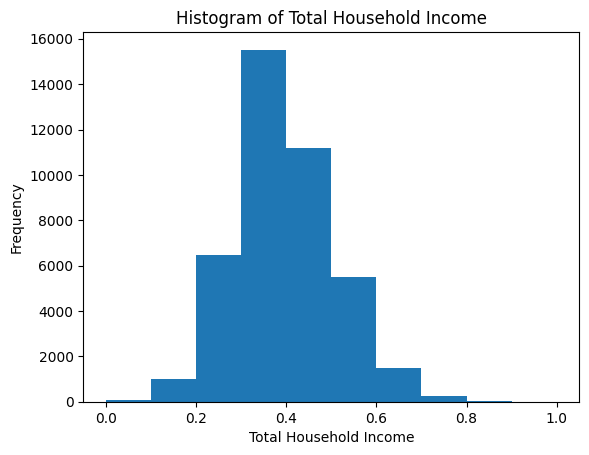

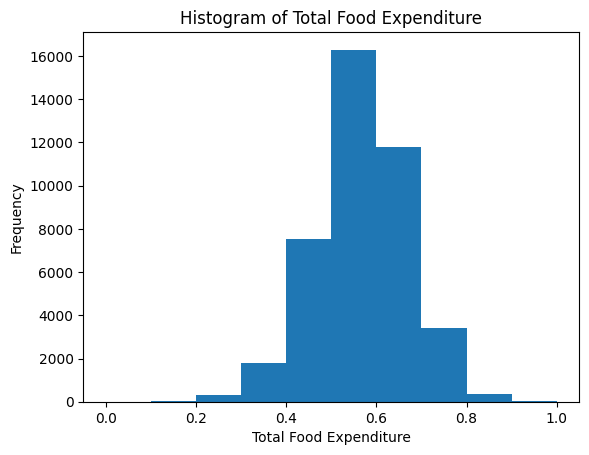

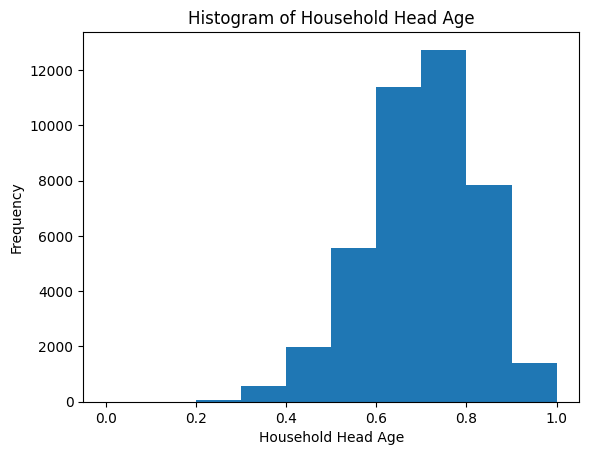

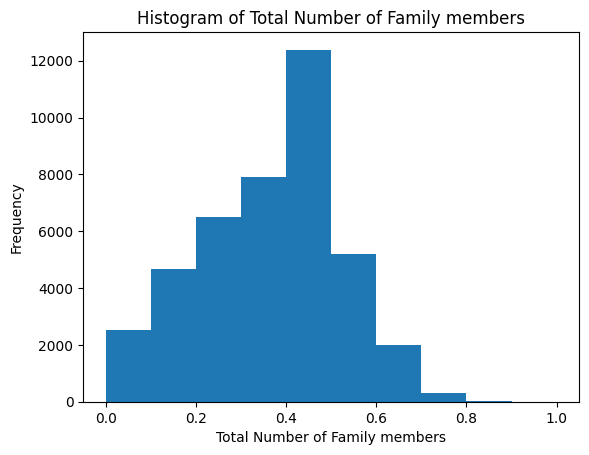

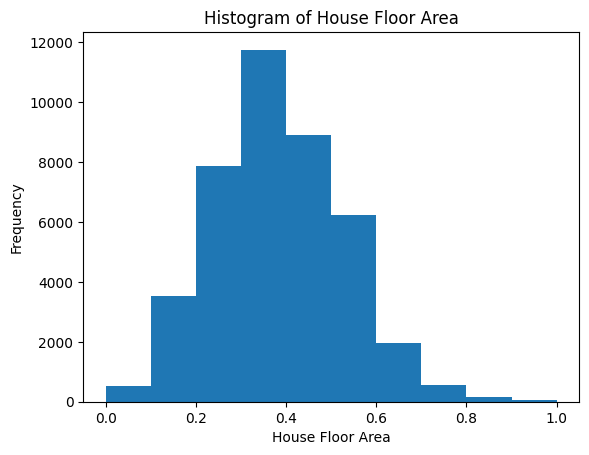

...

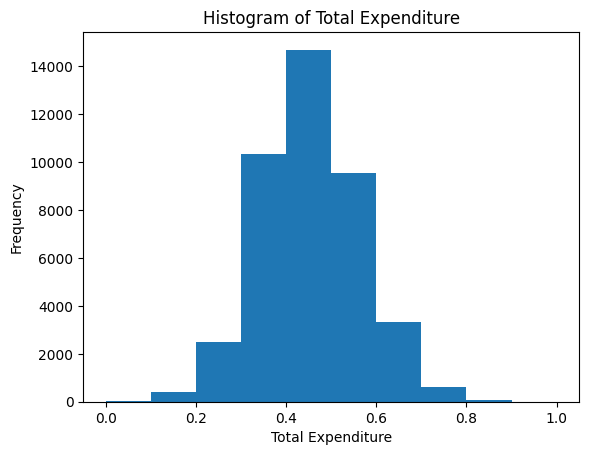

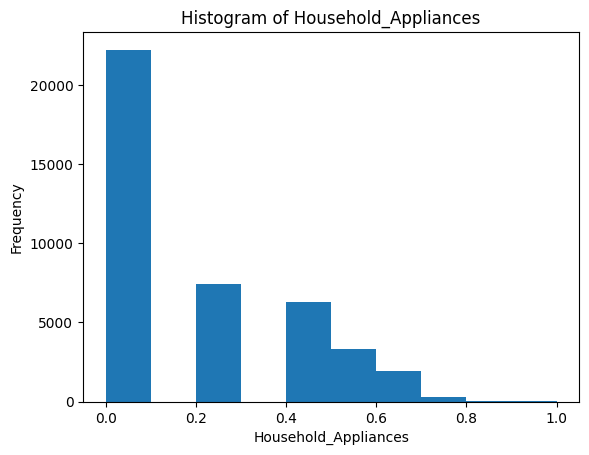

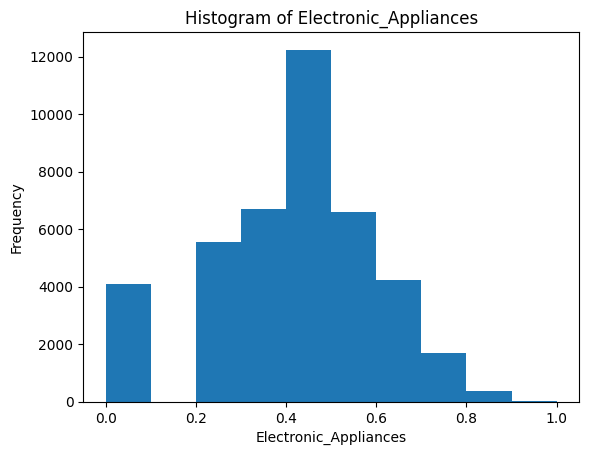

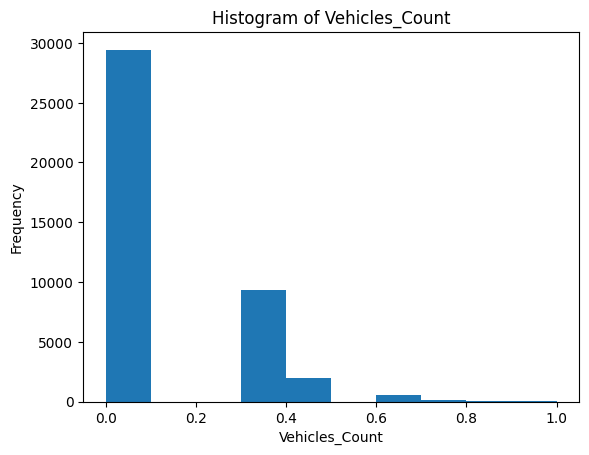

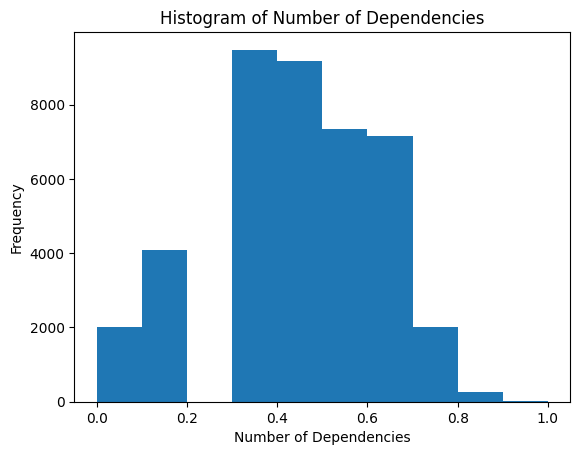

In [188]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_copy[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [189]:
# Fill Null Columns with 'Unknown'
df_copy[null_columns] = df_copy[null_columns].fillna('Unknown')

In [286]:
df[null_columns] = df[null_columns].fillna('Unknown')

In [190]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Agriculture, forestry, and fishing": [
        'Farmhands and laborers', 'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Foresters and related scientists', 'Inland and coastal waters fishermen', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Forestry laborers', 'Other orchard farmers', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'Motorized farm and forestry plant operators', 'Fishery laborers and helpers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Farm technicians', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Drivers of animal-drawn vehicles and machinery', 'Hunting and trapping laborers', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Mining and quarrying": [
        'Mining and quarrying laborers', 'Earth-moving and related plant operators', 'Miners and quarry workers', 'Shotfirers and blasters', 'Mining-plant operators', 'Well drillers and borers and related workers', 'Mineral ore and stone-processing plant operators'
    ],
    "Manufacturing": [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'General managers/managing proprietors in manufacturing', 'Hand packers and other manufacturing laborers', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Assembling laborers', 'Mechanical engineering technicians', 'Production supervisors and general foremen', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Chemical processing plant operators n. e. c.', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Rattan, bamboo and other wicker furniture makers', 'Rubber products machine operators', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Cement and other mineral products machine operators', 'Silk-screen, block and textile printers', 'Grain and spice milling machine operators', 'Production and operations managers in manufacturing', 'Other machine operators and assemblers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Metal-wheel grinders, polishers and tool sharpeners', 'Metal finishing, plating and coating machine operators', 'Charcoal makers and related workers', 'Automated assembly-line operators', 'Sugar production machine operators', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Dairy products makers', 'Meat and fish processing machine operators', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Baked goods and cereal and chocolate products machine operators', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Paperboard, textile and related products assemblers', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Petroleum and natural gas refining plant operators', 'Builders (traditional materials)', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Electricity, gas, steam and air conditioning supply": [
        'Lineman, line installers and cable splicers', 'Building and related electricians', 'Power production plant operators', 'Electrical mechanics and fitters', 'Riggers and cable splicers', 'Electronics fitters'
    ],
    "Water supply, sewerage, waste management and remediation activities": [
        'Garbage collectors', 'Incinerator, water treatment and related plant operators'
    ],
    "Construction": [
        'Carpenters and joiners', 'Building construction laborers', 'Masons and related concrete finishers', 'Painters and related workers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Plumbers, pipe fitters and other related workers', 'General managers/managing proprietors in construction', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Roofers', 'Production and operations managers in construction', 'Building frame and related trades workers n. e. c.', 'Crane, hoist and related plant operators', 'Floor layers and tile setters', 'Insulation workers', 'Wood treaters'
    ],
    "Wholesale and retail trade; repair of motor vehicles and motorcycles": [
        'General managers/managing proprietors in wholesale and retail trade', 'Stocks clerks', 'Shop salespersons and demonstrators', 'Motor vehicle mechanics and related trades workers', 'Door-to-door and telephone salespersons', 'Street ambulant vendors', 'Butchers, fishmongers and related food preparers', 'Market and sidewalk stall vendors', 'Stall and market salespersons', 'Cashiers and ticket clerks', 'Sales and marketing managers', 'Production and operations managers in wholesale and retail trade', 'Sales supervisors in retail trade', 'Buyers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Supply and distribution managers'
    ],
    "Transportation and storage": [
        'Transport conductors', 'Heavy truck and lorry drivers','General managers/managing proprietors in transportation, storage and communications', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Freight handlers', 'Transport clerks', 'Lifting truck operators', 'Production and operations managers in transport, storage and communications', 'Transport and communications service supervisors n. e. c.', 'Bus drivers', 'Mail carriers and sorting clerks', 'Hand or pedal vehicle drivers', 'Air transport service supervisors', 'Ship and aircraft controllers and technicians', 'Aircraft engine mechanics and fitters', 'Air traffic safety technicians', 'Maritime transport service supervisors', 'Locomotive engine drivers', 'Aircraft pilots, navigators and flight engineers'
    ],
    "Accommodation and food service activities": [
        'General managers/managing proprietors of restaurants and hotels', 'Cooks', 'Production and operations managers in restaurant and hotels', 'Waiters, waitresses and bartenders', 'Bakers, pastry cooks and confectionery makers', 'Housekeepers and related workers'
    ],
    "Information and communication": [
        'Broadcasting and telecommunications equipment operators', 'Data entry operators', 'Computer equipment operators', 'Other computer professionals', 'Computer programmers', 'Systems analysts and designers', 'Computer assistants', 'Telecommunication equipment installers and repairers', 'Postal service supervisors', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Advertising and public relations managers'
    ],
    "Financial and insurance activities": [
        'Tellers and other counter clerks', 'Statistical and finance clerks', 'Accounting and bookkeeping clerks', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Accountants and auditors', 'Bookkeepers', 'Finance and administration managers', 'Insurance representatives', 'Trade brokers', 'Other finance and sales associate professionals', 'Other business services and trade brokers'
    ],
    "Real estate activities": [
        'Estate agents', 'Appraisers and valuers'
    ],
    "Professional, Scientific and Technical Activities": [
        'Other social science professionals', 'Statistical, mathematical and related associate professionals', 'Civil engineers', 'Mechanical engineers', 'Agronomists and related scientists', 'Research and development managers', 'Professional, technical and related officers', 'Technical and commercial sales representatives', 'Architects', 'Electrical Engineers', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Computer engineers and related professionals', 'Other life science technicians', 'Legal and related business associate professionals', 'Other business professionals', 'Economists', 'Chemists', 'Civil engineering technicians', 'Statisticians', 'Electronics and communications engineers', 'Personnel and human resource development professionals', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Electronics and communications engineering technicians', 'Industrial engineers', 'Lawyers', 'Other physical science and engineering technicians', 'Chemical engineers', 'Geodetic engineers and related professionals', 'Business machines mechanics and repairers', 'Life science technicians', 'Other engineers and related professionals', 'Electrical engineering technicians'
    ],
    "Administrative and Support Service Activities": [
        'Secretaries', 'General managers/managing proprietors n. e. c.', 'Messengers, package and luggage porters and deliverers', 'Other office clerks', 'General managers/managing proprietors of business services', 'Other supervisors, n. e. c.', 'Building caretakers', 'Doorkeepers, watchpersons and related workers', 'Personnel and industrial relations managers', 'Library and filing clerks', 'Other administrative associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Labor contractors and employment agents', 'Other specialized managers', 'Receptionists and information clerks', 'Administrative secretaries and related associate professionals', 'Word processor and related operators', 'Production clerks', 'Travel consultants and organizers', 'Stenographers and typists', 'Production and operations managers in business services'
    ],
    "Education": [
        'General elementary education teaching professionals', 'College, university and higher education teaching professionals', 'School supervisors and principals', 'School principals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Teaching associate professionals', 'Education methods specialists', 'Pre-elementary education teaching professionals', 'Technical and vocational instructors/trainors', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Other teaching professionals'
    ],
    "Human Health and Social Work Activities": [
        'Social work associate professionals', 'Medical technologists', 'Child care workers', 'Institution-based personal care workers', 'Traditional medicine practitioners', 'Midwifery associate professionals', 'Professional nurses', 'Veterinary assistants', 'Pharmacists', 'Nutritionists-dietitians', 'Professional midwives', 'Home-based personal care workers', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Medical doctors', 'Faith healers', 'Dentists', 'Social work professionals', 'Other health professionals (except nursing)', 'Dental assistants', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Arts, Entertainment and Recreation": [
        'Bet bookmakers and croupiers', 'Choreographers and dancers', 'Athletes and related workers', 'Decorators and commercial designers', 'Street, nightclub and related musicians, singers and dancers', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Fashion and other models', 'Sculptors, painters and related artists', 'Photographic and related workers', 'Radio, television and other announcers', 'Authors, journalists and other writers', 'Other creative or performing artists'
    ],
    "Other service activities": [
        'Helpers and cleaners in offices, hotels and other establishments', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Non-ordained religious associate professionals', 'Religious professionals', 'Domestic helpers and cleaners', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Photographic products machine operators', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Shoe cleaning and other street services elementary occupations', 'Personal care and related workers, n. e. c.', 'Production and operations managers in personal care, cleaning and relative services', 'Other personal services workers, n. e. c.', 'Companions and valets', 'Travel guides', 'Bleaching, dyeing and cleaning machine operators', 'Service and related workers', 'Vehicle, window and related cleaners', 'Tanners'
    ],
    "Government and Public Service": [
        'Justices', 'Protective services workers n. e. c.', 'Traditional chiefs and heads of villages', 'Legislative officials', 'Police inspectors and detectives', 'Prison guards', 'Government administrators (including career executive service officers)', 'Police officers', 'Enlisted personnel n. e. c.', 'Combat soldiers', 'Firefighters', 'Staff officers', 'Government tax and excise officials', 'Commanding officers', 'Customs and immigration inspectors', 'Government licensing officials', 'Senior officials of humanitarian and other special-interest organizations', 'Building and fire inspectors', 'Other government associate professionals', 'Government social benefits officials', 'Officers, n. e. c.'
    ],
    "Workers reporting occupations unidentifiable or inadequately defined":[
        'Workers reporting occupations unidentifiable or inadequately defined'
    ],
    "Directors and chief executives of corporations": [
        'Directors and chief executives of corporations'
    ]
}

In [191]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [192]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [193]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Agriculture, forestry, and fishing:
['Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Hog raising farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Foresters and related scientists', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers

In [194]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [195]:
df_copy['Household Head Occupation'] = df_copy['Household Head Occupation'].apply(categorize_occupation)

In [287]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [196]:
df_copy['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Agriculture, forestry, and fishing",13543
Uncategorized,7536
Wholesale and retail trade; repair of motor vehicles and motorcycles,4188
Transportation and storage,4170
Construction,2962
Manufacturing,2010
Government and Public Service,1521
Administrative and Support Service Activities,1470
Other service activities,1227


In [197]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Elementary Graduate'
    ],
    3 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    4 :[
        'High School Graduate'
    ],
    5 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [198]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Elementary Graduate'], 3: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 4: ['High School Graduate'], 5: ['Second Year High School', 'Third Year High School', 'First Year High School'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [199]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [200]:
categorized_results = check_education_categorization(df_copy, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1228 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (7640 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
3 (8821 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
4 (9628 entries):
['High School 

In [201]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [202]:
# Apply to 'Household Head Highest Grade Completed'
df_copy['Household Head Highest Grade Completed'] = df_copy['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [288]:
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [203]:
df_copy['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
4,9628
3,8821
2,7640
7,5441
5,4896
6,3628
0,1228
8,247
1,15


In [204]:
type_of_roof_classification = {
    0 : [
        'Not Applicable'
    ],
    1 : [
        'Salvaged/makeshift materials', 'Mixed but predominantly salvaged materials'
    ],
    2 :[
        'Mixed but predominantly light materials', 'Light material (cogon,nipa,anahaw)'
    ],
    3 :[
        'Mixed but predominantly strong materials', 'Strong material(galvanized,iron,al,tile,concrete,brick,stone,asbestos)'
    ],
    4 :[
        'High School Graduate'
    ],
}

In [205]:
# Function to categorize_roof_classification
def categorize_roof_classification(roof_classification):
    for category, roof_levels in type_of_roof_classification.items():
        if roof_classification in roof_levels:
            return category
    return 'Uncategorized'

In [206]:
# Apply classification to type of roof
df_copy['Type of Roof'] = df_copy['Type of Roof'].apply(categorize_roof_classification)

In [207]:
wall_mapping = {
    'Very Light': 2,
    'Light': 3,
    'Salvaged': 1,
    'Quite Strong': 4,
    'Strong': 5,
    'NOt applicable': 0
}

In [208]:
# Map Type of Wall
df_copy['Type of Walls'] = df_copy['Type of Walls'].map(wall_mapping)

In [209]:
toilet_maping = {
    'Unknown': 0,
    'Open pit': 2,
    'Closed pit': 3,
    'Others': 1,
    'Water-sealed, other depository, shared with other household': 4,
    'Water-sealed, other depository, used exclusively by household': 5,
    'Water-sealed, sewer septic tank, shared with other household': 6,
    'Water-sealed, sewer septic tank, used exclusively by household': 7
}

In [210]:
# Map Toilet Facilities
df_copy['Toilet Facilities'] = df_copy['Toilet Facilities'].map(toilet_maping)

In [211]:
df_copy['Toilet Facilities'].value_counts()

,count
Toilet Facilities,
7,29162
6,3694
5,2343
3,2273
0,1580
2,1189
4,950
1,353


In [212]:
water_mapping = {
    'Lake, river, rain and others': 2,
    'Unprotected spring, river, stream, etc': 3,
    'Dug well': 4,
    'Tubed/piped shallow well': 5,
    'Protected spring, river, stream, etc': 6,
    'Shared, tubed/piped deep well': 7,
    'Shared, faucet, community water system': 8,
    'Own use, tubed/piped deep well': 9,
    'Own use, faucet, community water system': 10,
    'Peddler': 0,
    'Others': 1
    }

In [213]:
# Map Main Source of Water Supply
df_copy['Main Source of Water Supply'] = df_copy['Main Source of Water Supply'].map(water_mapping)

In [214]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [215]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [216]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_copy['Region'] = label_encoder.fit_transform(df_copy['Region'])
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Tenure Status'] = label_encoder.fit_transform(df_copy['Tenure Status'])
df_copy['Type of Building/House'] = label_encoder.fit_transform(df_copy['Type of Building/House'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

In [217]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 33 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  float64
 1   Region                                                      41544 non-null  int64  
 2   Total Food Expenditure                                      41544 non-null  float64
 3   Agricultural Household indicator                            41544 non-null  int64  
 4   Household Head Age                                          41544 non-null  float64
 5   Household Head Marital Status                               41544 non-null  int64  
 6   Household Head Highest Grade Completed                      41544 non-null  int64  
 7   Household Head Occupation                                   41544 non-null  int64  
 

In [218]:
df_copy.head()

,Total Household Income,Region,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Household Head Marital Status,Household Head Highest Grade Completed,Household Head Occupation,Household Head Class of Worker,Total Number of Family members,...,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies,Main Source of Income_Other sources of Income,Main Source of Income_Wage/Salaries,Household Head Sex_Male,Household Head Job or Business Indicator_With Job/Business,Type of Household_Single Family,Type of Household_Two or More Nonrelated Persons/Members
0,0.539417,1,0.654256,0,0.698970,3,7,6,3,0.352055,...,0.41629,0.537710,0.315465,0.445714,False,True,False,True,False,False
1,0.412143,1,0.556102,0,0.612784,2,7,17,4,0.266320,...,0.26265,0.624044,0.500000,0.304247,False,True,True,True,True,False
2,0.286569,1,0.539206,1,0.602060,2,3,2,4,0.481334,...,0.00000,0.000000,0.000000,0.575876,False,True,True,True,True,False
3,0.324256,1,0.581480,0,0.724276,2,2,2,0,0.266320,...,0.00000,0.329695,0.000000,0.445714,False,True,True,True,True,False
4,0.405527,1,0.615324,0,0.819544,2,2,17,1,0.352055,...,0.26265,0.482995,0.315465,0.304247,False,True,True,True,True,False


In [219]:
df_copy.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Agricultural Household indicator,0
Household Head Age,0
Household Head Marital Status,0
Household Head Highest Grade Completed,0
Household Head Occupation,0
Household Head Class of Worker,0
Total Number of Family members,0


In [220]:
df_copy.duplicated().sum()

0

In [221]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 33 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  float64
 1   Region                                                      41544 non-null  int64  
 2   Total Food Expenditure                                      41544 non-null  float64
 3   Agricultural Household indicator                            41544 non-null  int64  
 4   Household Head Age                                          41544 non-null  float64
 5   Household Head Marital Status                               41544 non-null  int64  
 6   Household Head Highest Grade Completed                      41544 non-null  int64  
 7   Household Head Occupation                                   41544 non-null  int64  
 

In [222]:
# Drop Food Expenditure
df_copy.drop(['Total Food Expenditure'], axis=1, inplace=True)

In [223]:
# Drop Total_Essential_Spending
df_copy.drop(['Total_Essential_Spending'], axis=1, inplace=True)

In [224]:
# Drop Total_NonEssential_Spending
df_copy.drop(['Total_NonEssential_Spending'], axis=1, inplace=True)

In [225]:
# Drop Type of Roof
df_copy.drop(['Type of Roof'], axis=1, inplace=True)

In [226]:
# Drop Type of Walls
df_copy.drop(['Type of Walls'], axis=1, inplace=True)

In [227]:
# Drop Household Head Class of Worker
df_copy.drop(['Household Head Class of Worker'], axis=1, inplace=True)

In [228]:
# Drop Number of bedrooms, Household Head Age, House Age
df_copy.drop(['Number of bedrooms', 'Household Head Age', 'House Age'], axis=1, inplace=True)

In [232]:
df_copy.drop(['Tenure Status', 'Toilet Facilities', 'Electricity', 'Main Source of Water Supply', 'Vehicles_Count'], axis=1, inplace=True)

In [243]:
# Drop 'Type of Building/House'
df_copy.drop(['Type of Household_Single Family', 'Type of Household_Two or More Nonrelated Persons/Members', 'Type of Building/House'], axis=1, inplace=True)

In [246]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 15 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  float64
 1   Region                                                      41544 non-null  int64  
 2   Agricultural Household indicator                            41544 non-null  int64  
 3   Household Head Marital Status                               41544 non-null  int64  
 4   Household Head Highest Grade Completed                      41544 non-null  int64  
 5   Household Head Occupation                                   41544 non-null  int64  
 6   Total Number of Family members                              41544 non-null  float64
 7   House Floor Area                                            41544 non-null  float64
 

In [245]:
# Drop 'Electronic_Appliances'
df_copy.drop(['Electronic_Appliances'], axis=1, inplace=True)

In [247]:
# Drop 'Electronic_Appliances'
df_copy.drop(['Household_Appliances'], axis=1, inplace=True)

# Model Training

For cluster = 1, SSE/WCSS is 3460182.86641131
For cluster = 2, SSE/WCSS is 1359199.8570594708
For cluster = 3, SSE/WCSS is 958526.6820751498
For cluster = 4, SSE/WCSS is 692053.8142965331
For cluster = 5, SSE/WCSS is 582904.4897182821
For cluster = 6, SSE/WCSS is 525999.4705221391
For cluster = 7, SSE/WCSS is 472006.82076844963
For cluster = 8, SSE/WCSS is 430025.8226422586
For cluster = 9, SSE/WCSS is 399128.44533520815
For cluster = 10, SSE/WCSS is 376680.7762610569


Text(0, 0.5, 'WCSS')

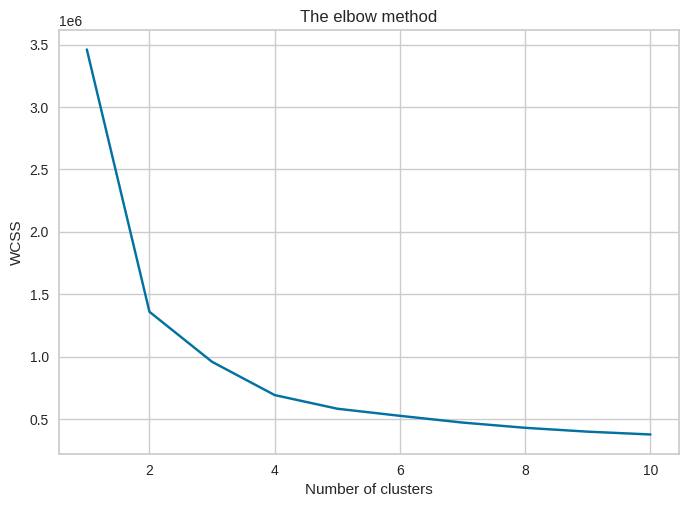

In [248]:
# Use Elbow Method to find optimal KMeans
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_copy)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

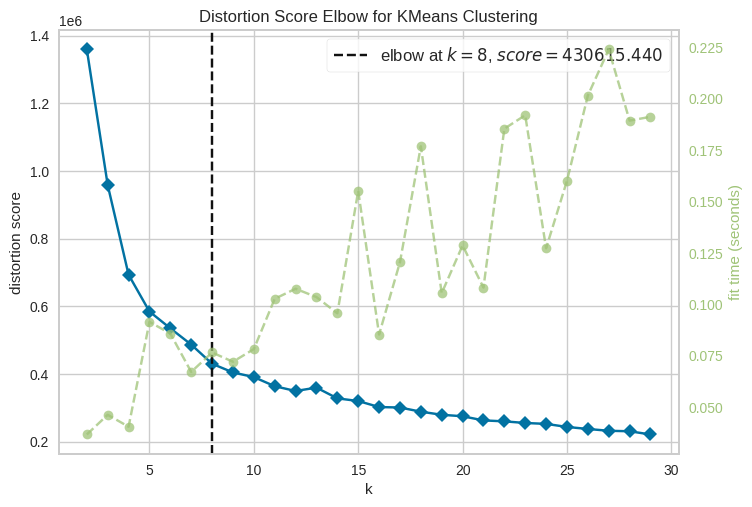

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [249]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(df_copy)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

In [250]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_copy)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_copy,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.5259380662580424
For cluster= 3, Silhouette Coefficient is 0.4707852627658057
For cluster= 4, Silhouette Coefficient is 0.39070451900583897
For cluster= 5, Silhouette Coefficient is 0.32752933981342586
For cluster= 6, Silhouette Coefficient is 0.3564679414318927
For cluster= 7, Silhouette Coefficient is 0.2941598398495361
For cluster= 8, Silhouette Coefficient is 0.3168227933456399
For cluster= 9, Silhouette Coefficient is 0.3131436355387879


In [266]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

def visualize_silhouette(cluster_lists, X_features):

    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

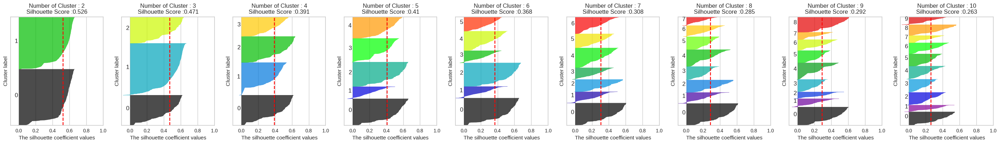

In [267]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_copy)

In [251]:
# Perform PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_copy)

In [252]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print(cumsum)
d = np.argmax(cumsum >= 0.90) + 1
print("dimension : ", d)

[0.67441162 0.93316731 0.97054315 0.9860048  0.99143836 0.9955652
 0.99693683 0.99807149 0.99893141 0.99955181]
dimension :  2


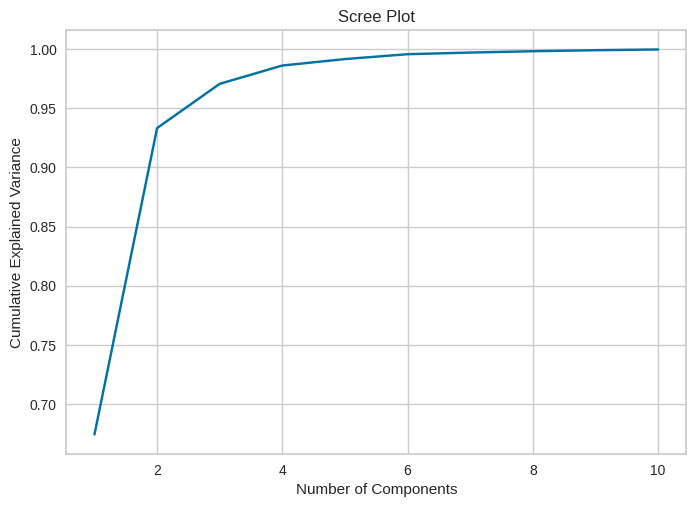

In [253]:
# Display the Scree Plot and label where it hits 0.9 cumulative explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()

In [254]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_copy)

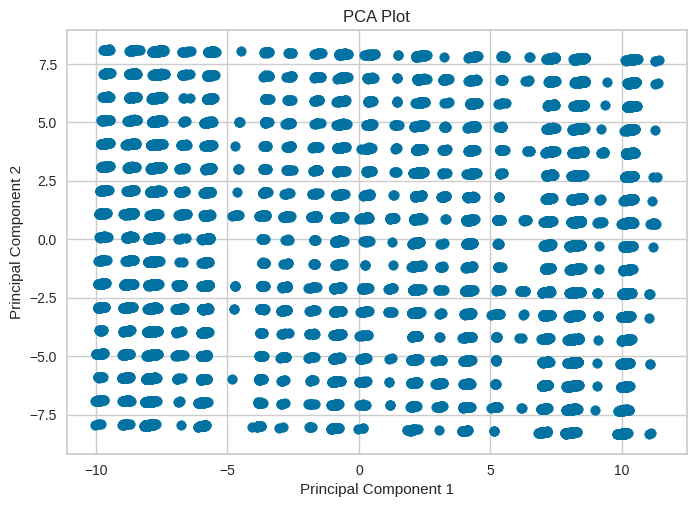

In [255]:
# Plot PCA
plt.scatter(df_pca[:, 0], df_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

In [256]:
# Print Loading Scores
print(pca.components_)

[[ 3.13006218e-03  2.01663688e-02 -1.32563561e-02  3.12425568e-02
   4.30334582e-02  9.97760391e-01 -1.97055220e-03  2.67363269e-03
   1.99416444e-03 -1.60226179e-03  8.56543974e-03 -1.82298465e-03
  -1.58371263e-02 -2.66258377e-02]
 [-1.37591680e-03  9.99663539e-01  9.08071207e-03  5.96954717e-04
   8.41743966e-03 -2.04274150e-02 -1.43348914e-03 -4.98697355e-03
  -1.91702243e-03 -1.82664634e-03  2.84620867e-03  7.28768973e-03
  -1.07946672e-03  1.91170668e-03]]


For cluster = 1, SSE/WCSS is 3228929.543671016
For cluster = 2, SSE/WCSS is 1128118.4808422131
For cluster = 3, SSE/WCSS is 727533.725114685
For cluster = 4, SSE/WCSS is 462340.7010578099
For cluster = 5, SSE/WCSS is 355410.4897382584
For cluster = 6, SSE/WCSS is 301388.37325064413
For cluster = 7, SSE/WCSS is 248980.5321094959
For cluster = 8, SSE/WCSS is 204391.91215936636
For cluster = 9, SSE/WCSS is 173972.5899112071
For cluster = 10, SSE/WCSS is 151796.5482912102


Text(0, 0.5, 'WCSS')

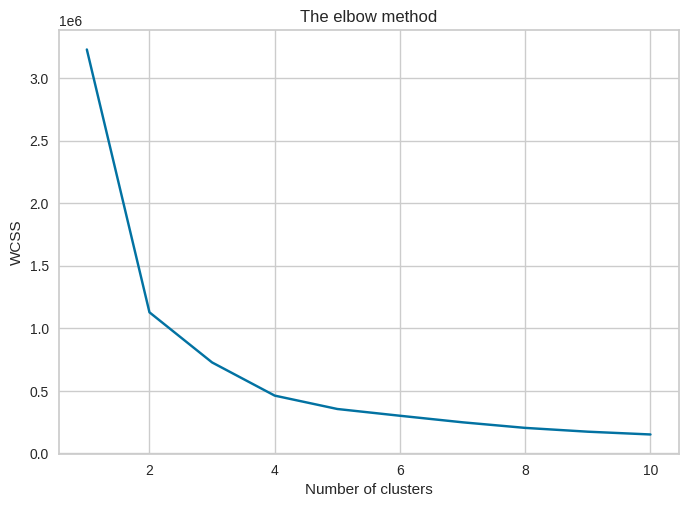

In [257]:
# Use df_pca for K_Means
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_pca)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

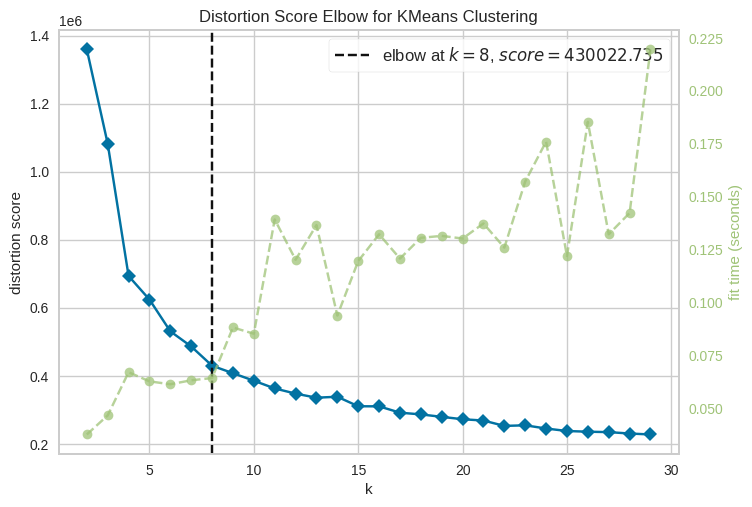

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [258]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(df_copy)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

In [259]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_pca)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_pca,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.5768910681364633
For cluster= 3, Silhouette Coefficient is 0.5473365057641572
For cluster= 4, Silhouette Coefficient is 0.4953604306645165
For cluster= 5, Silhouette Coefficient is 0.5214895724953658
For cluster= 6, Silhouette Coefficient is 0.47984216663665336
For cluster= 7, Silhouette Coefficient is 0.4906128551296257
For cluster= 8, Silhouette Coefficient is 0.4720475787913684
For cluster= 9, Silhouette Coefficient is 0.4687523654224669


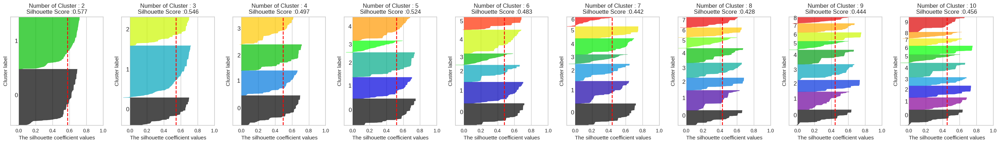

In [268]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_pca)

In [274]:
# Train Kmeans model with 4 Clusters using df_pca
kmeans = KMeans(n_clusters=2, max_iter=100)
kmeans.fit(df_pca)

KMeans(max_iter=100, n_clusters=2)

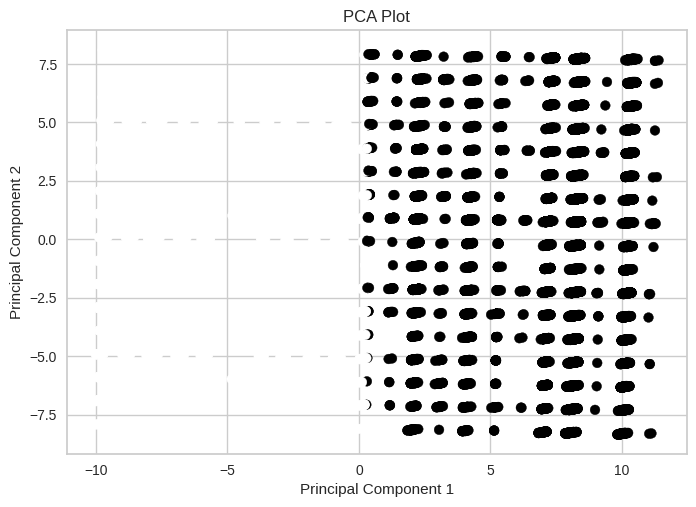

In [275]:
# Plot PCA Model using Generated clusters
plt.scatter(df_pca[:, 0], df_pca[:, 1], c=kmeans.labels_)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

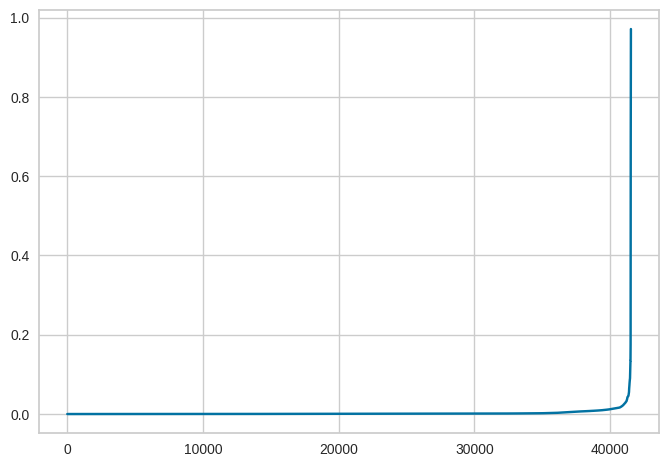

In [273]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors=200)
nbrs = neigh.fit(df_pca)
distances, indices = nbrs.kneighbors(df_pca)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
# Train DBSCAN Model
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=2.1, min_samples=100)
dbscan.fit(df_pca)

DBSCAN(eps=2.1, min_samples=100)

In [ ]:
# Output silhouette Score
from sklearn.metrics import silhouette_score
silhouette_score(df_pca, dbscan.labels_)

0.20915059677851028

In [ ]:
# download optuna
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.1 MB/s eta 0:00:00


In [ ]:
# import optuna
import optuna
from sklearn import metrics

def objective(trial):
    eps = trial.suggest_float('eps', 1.9, 2.5)
    min_samples = trial.suggest_int('min_samples', 1, 1000)

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(df_pca)

    try:
        silhouette_avg = metrics.silhouette_score(df_pca, labels)
    except ValueError:  # Silhouette score may raise a ValueError if there's only one cluster
        silhouette_avg = -1

    return silhouette_avg

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-02-27 10:56:17,003] A new study created in memory with name: no-name-5a6106b3-174b-4549-9819-2415ef215f36
[I 2025-02-27 10:56:38,990] Trial 0 finished with value: -0.08448634141435017 and parameters: {'eps': 3.1709260765952507, 'min_samples': 437}. Best is trial 0 with value: -0.08448634141435017.
[I 2025-02-27 10:57:01,823] Trial 1 finished with value: 0.05400951613066841 and parameters: {'eps': 3.120440368543997, 'min_samples': 148}. Best is trial 1 with value: 0.05400951613066841.
[I 2025-02-27 10:57:23,899] Trial 2 finished with value: -0.002750660877572202 and parameters: {'eps': 3.1749444353485323, 'min_samples': 359}. Best is trial 1 with value: 0.05400951613066841.
[I 2025-02-27 10:57:46,085] Trial 3 finished with value: -0.07658887006118303 and parameters: {'eps': 3.0364365249420633, 'min_samples': 371}. Best is trial 1 with value: 0.05400951613066841.
[I 2025-02-27 10:58:09,342] Trial 4 finished with value: 0.07326087656431689 and parameters: {'eps': 3.394328507308925

# Profiling / Describing the Clusters

In [276]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [289]:
# Create new df based from labels and their indices
df['Cluster'] = cluster_labels

In [290]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 65 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

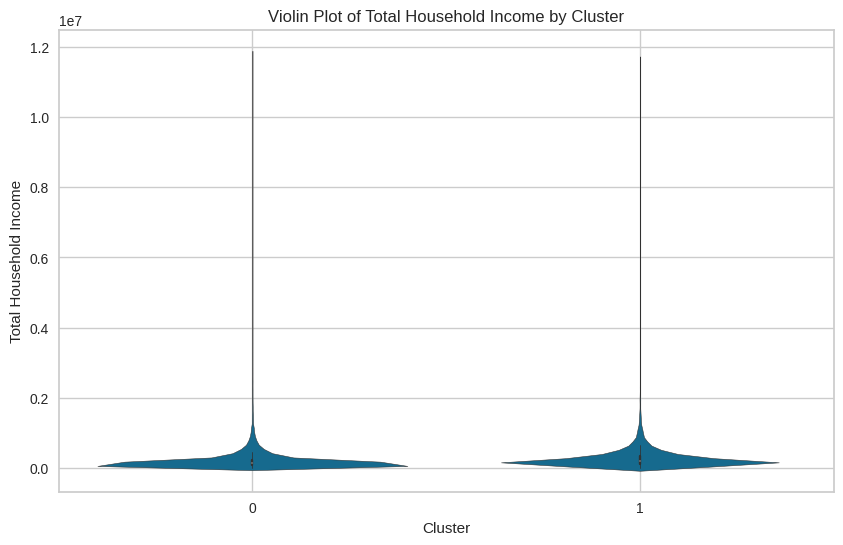

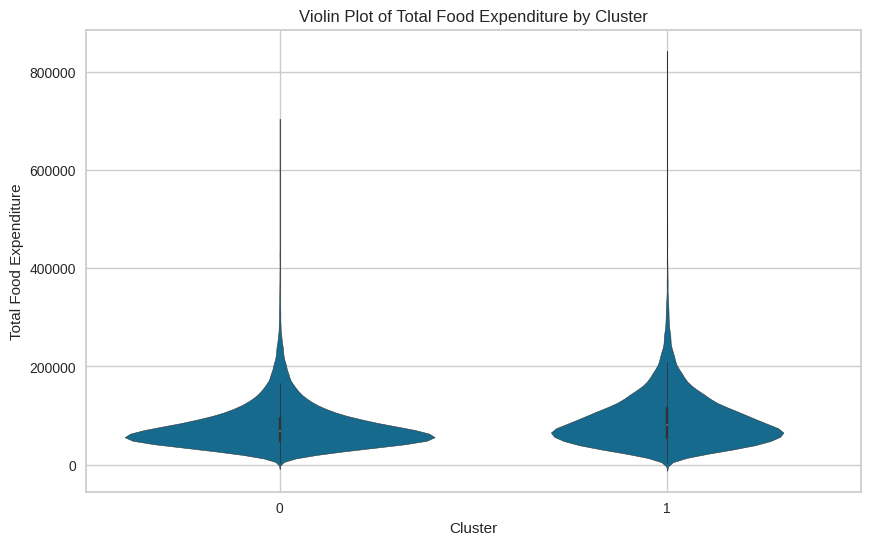

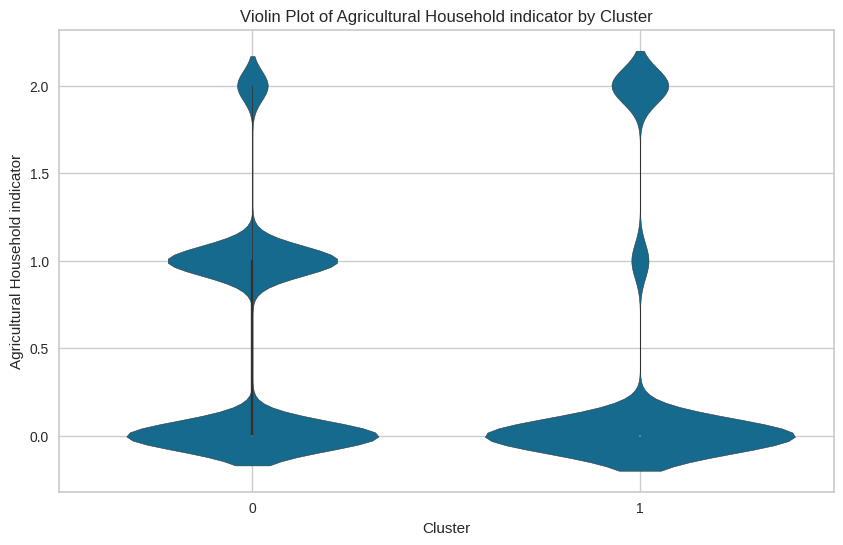

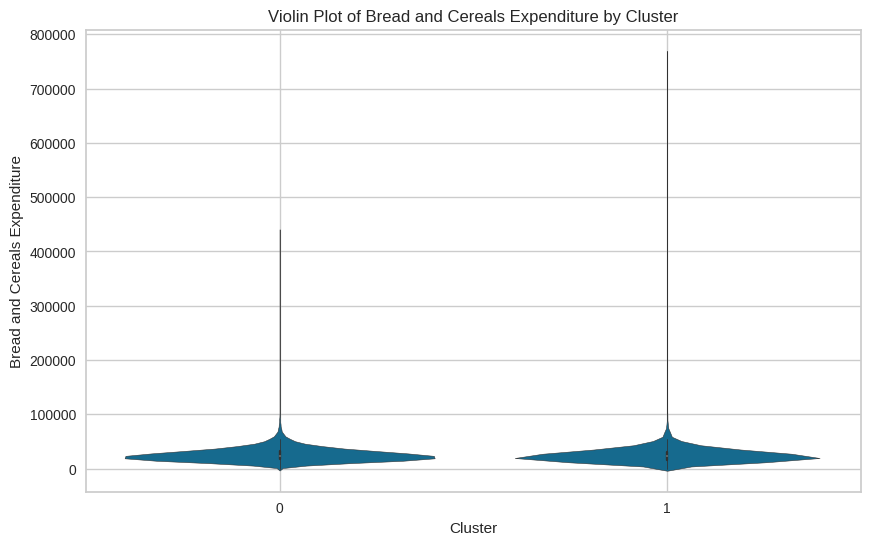

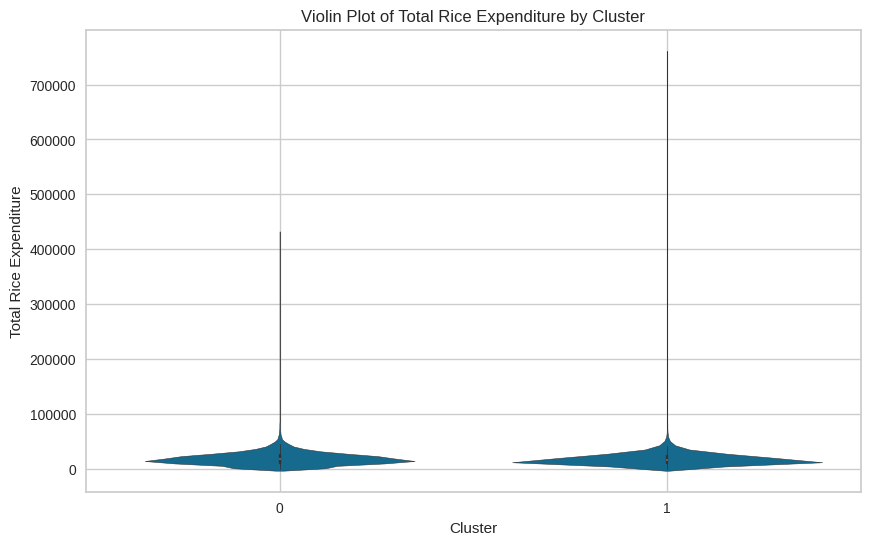

...

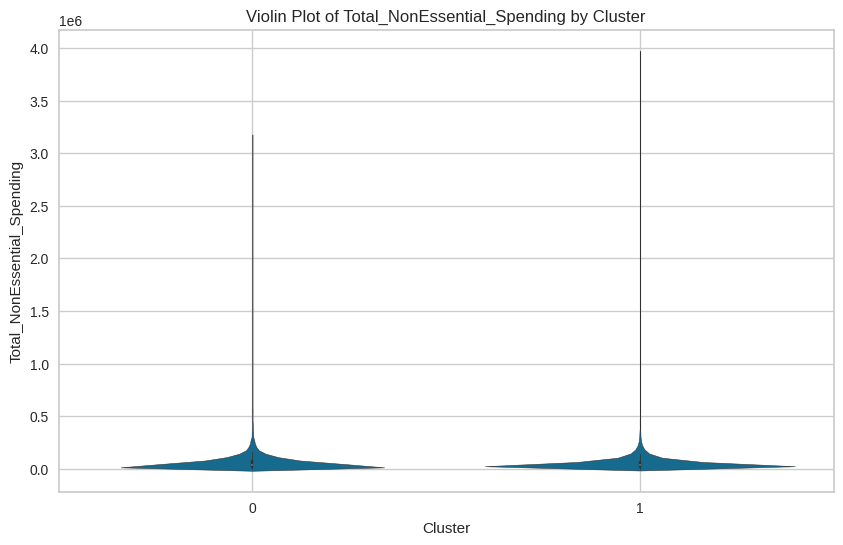

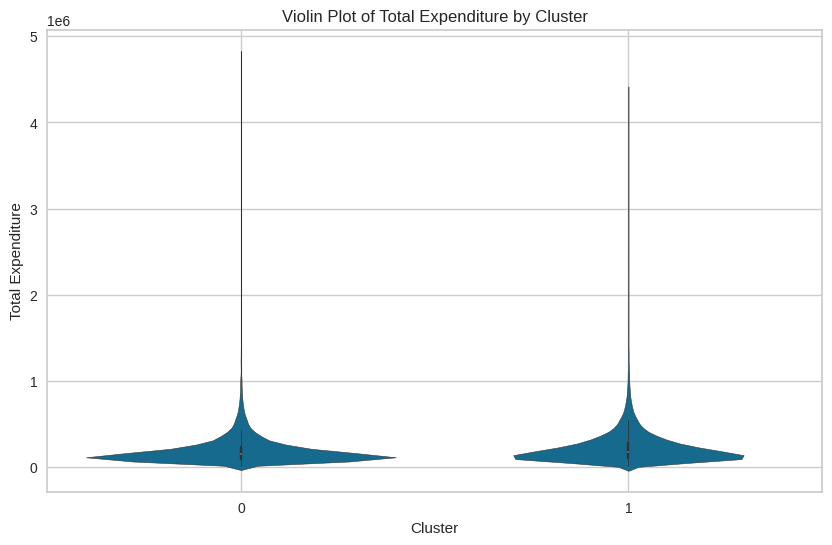

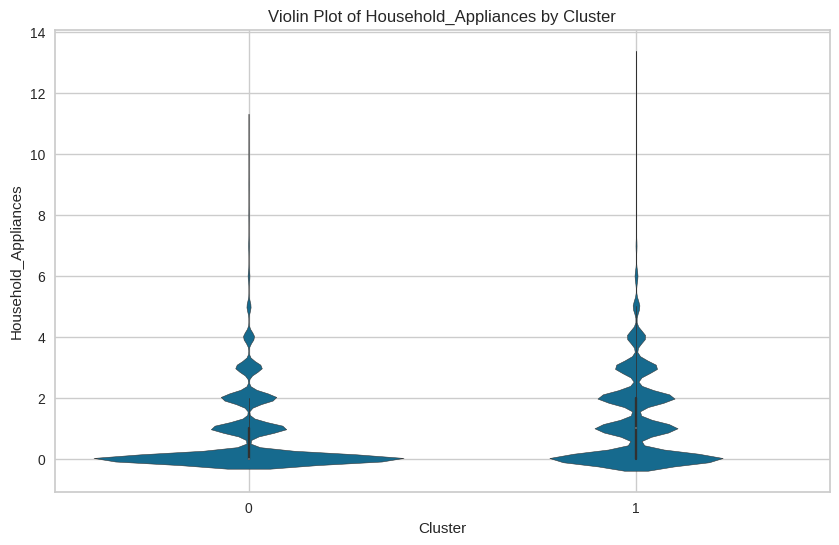

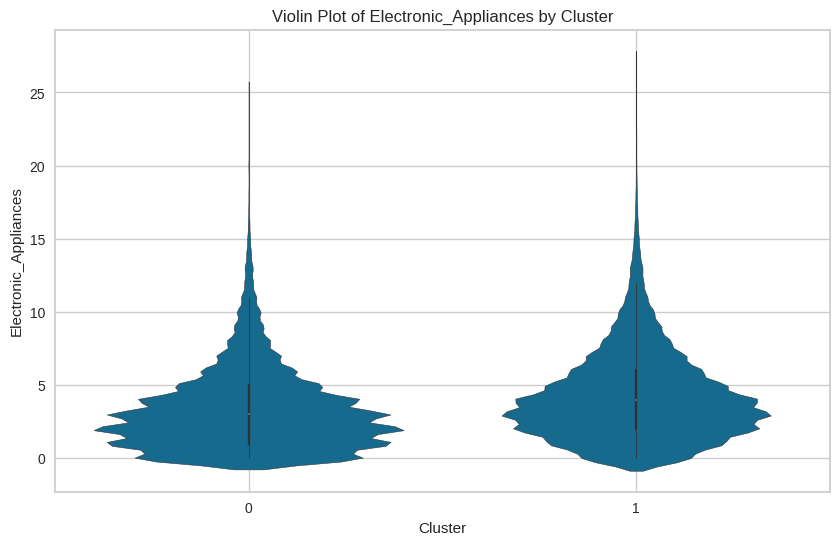

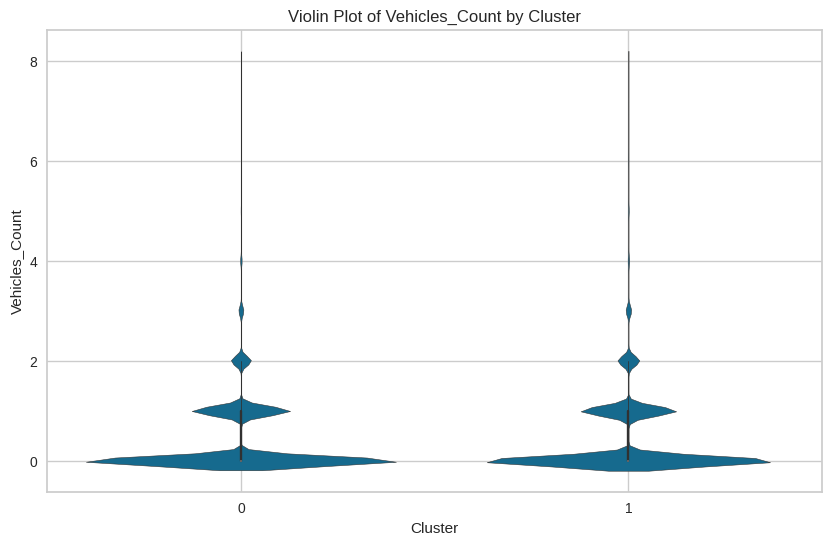

In [292]:
numerical_columns = df.select_dtypes(include=['number']).columns.tolist()
if 'Cluster' in numerical_columns:
    numerical_columns.remove('Cluster')

# Iterate and create violin plots
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='Cluster', y=column, data=df)
    plt.title(f'Violin Plot of {column} by Cluster')
    plt.grid(True)
    plt.show()

<ipython-input-293-ac3a30534c05>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


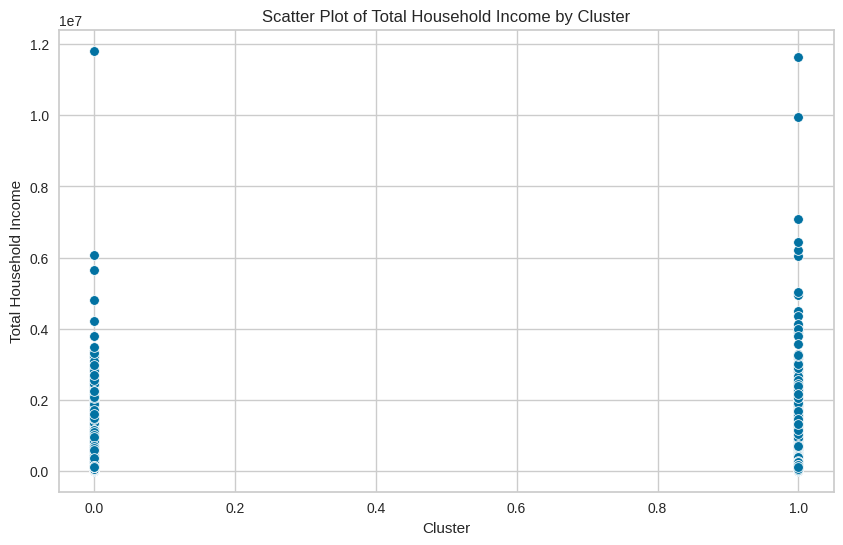

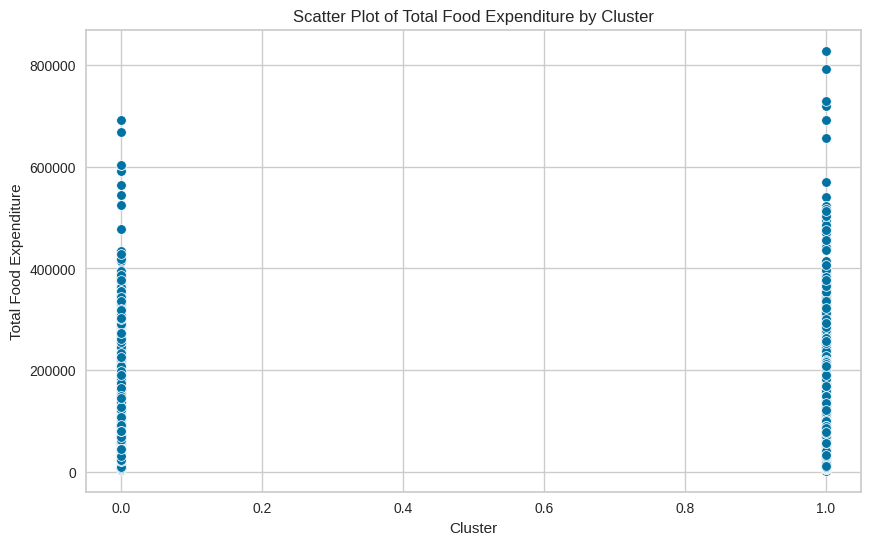

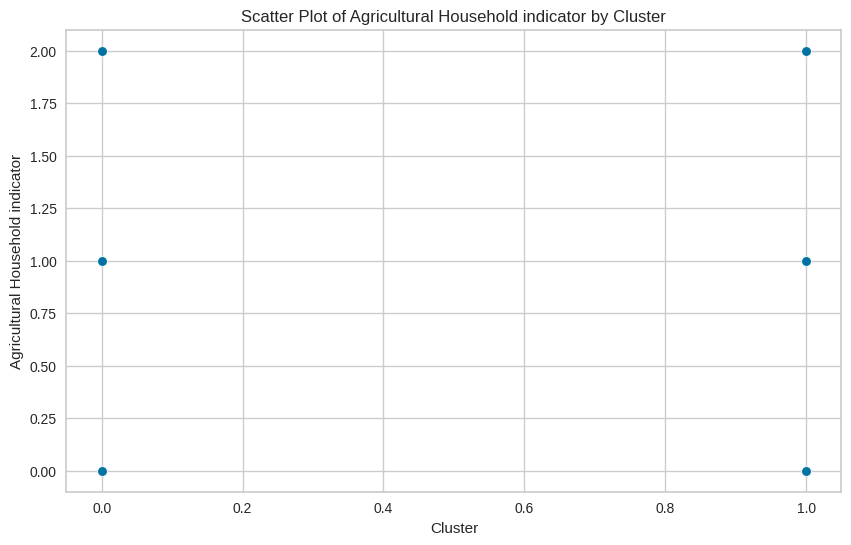

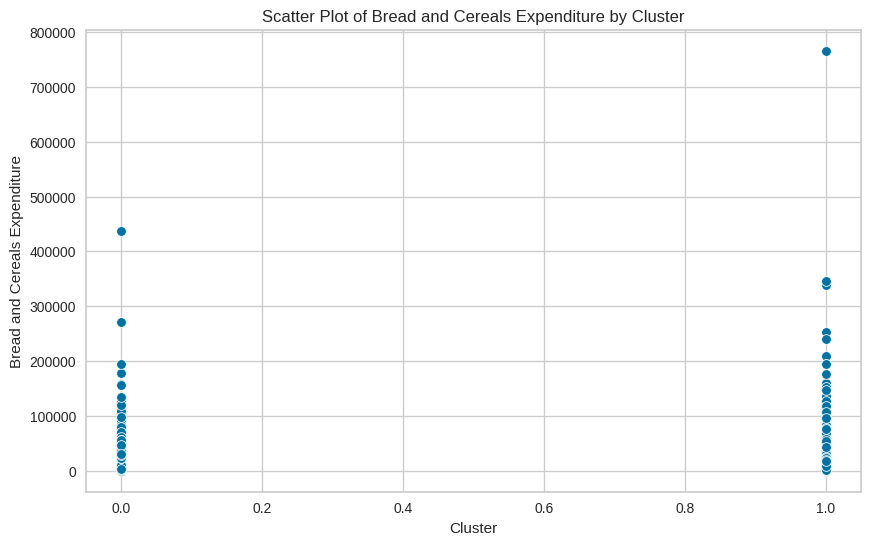

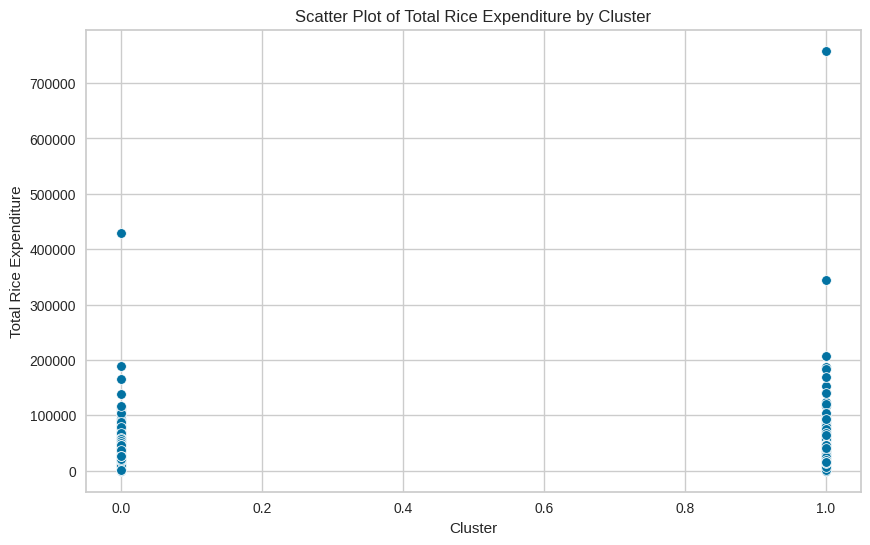

...

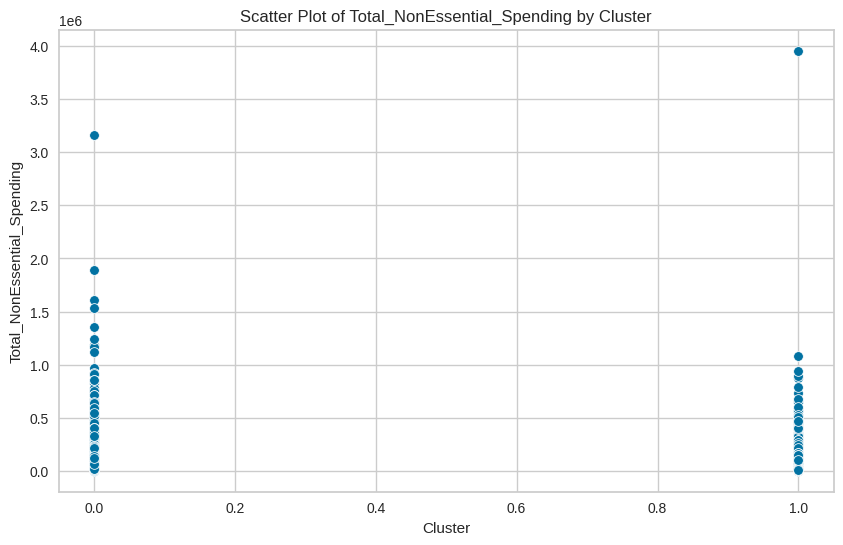

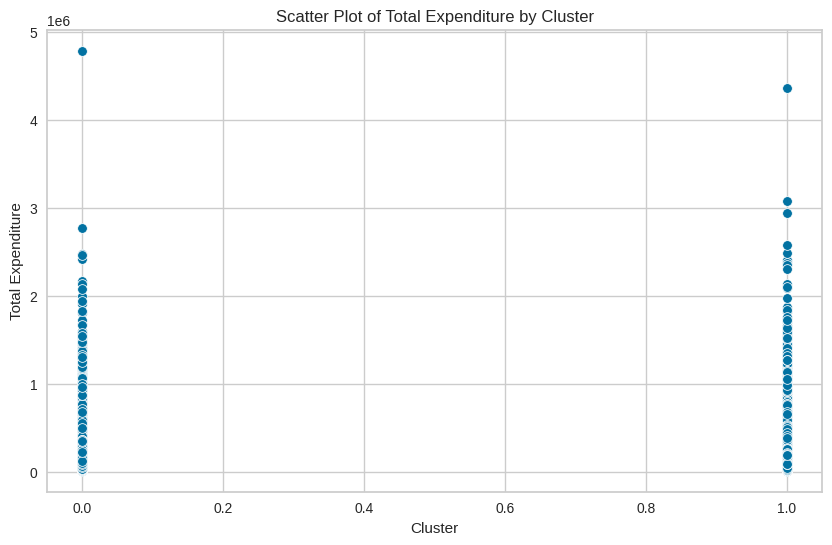

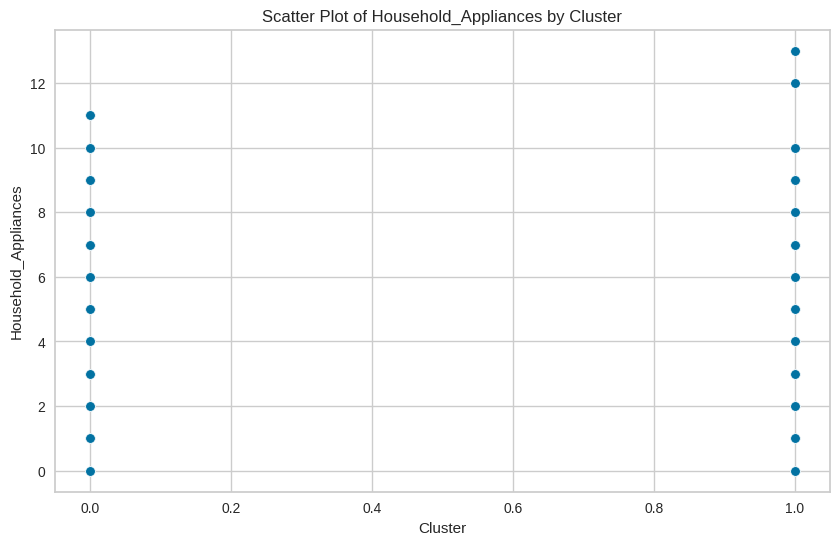

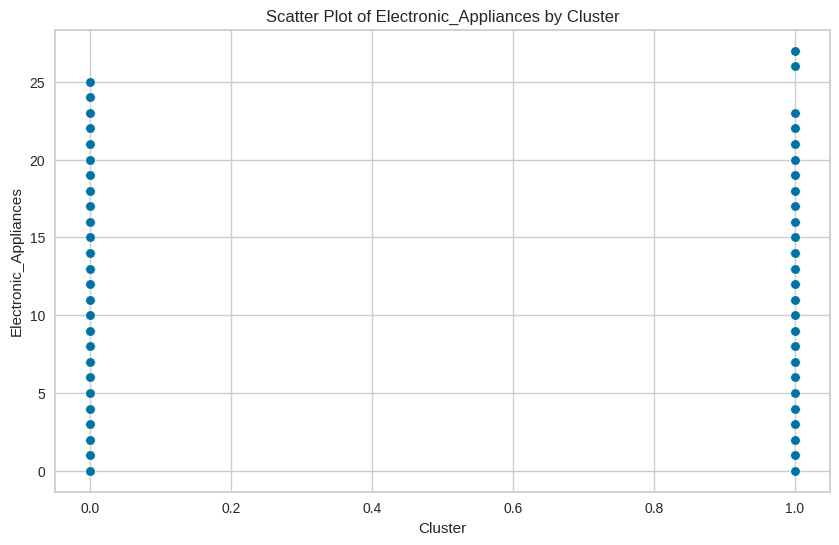

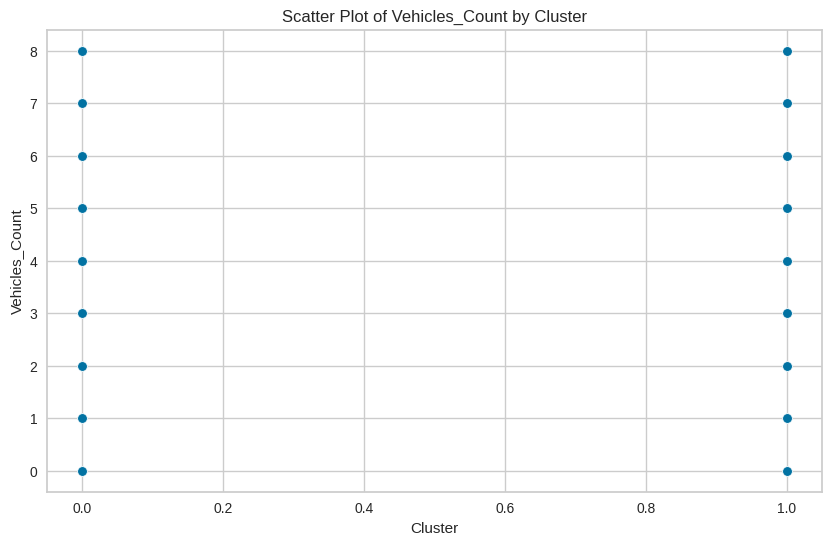

In [293]:
# Iterate and create scatter plots
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='Cluster', y=column, data=df)
    plt.title(f'Scatter Plot of {column} by Cluster')
    plt